In [2]:
# initial setup
try:
    # settings colab:
    import google.colab

    ! mkdir -p ../Data
    # los que usan colab deben modificar el token de esta url:
    ! wget -O ../Data/bikes.csv https://raw.githubusercontent.com/Digital-House-DATA/ds_blend_students_2020/master/M3/CLASE_16_Regresion_Lineal_Multiple/Data/bikes.csv?token=AA4GFHIG665I3BPVQCFY3US63APZM
    
except ModuleNotFoundError:    
    # settings local:
    %run "common/0_notebooks_base_setup.py"

default checking
Running command `conda list`... ok
jupyterlab=1.2.6 already installed
pandas=1.0.3 already installed
matplotlib=2.2.2 already installed
bokeh=2.0.0 already installed
seaborn=0.10.0 already installed
ipywidgets=7.5.1 already installed
pytest=5.3.4 already installed
chardet=3.0.4 already installed
psutil=5.7.0 already installed
scipy=1.4.1 already installed
statsmodels=0.11.0 already installed
scikit-learn=0.22.1 already installed
xlrd=1.2.0 already installed


In [216]:
import pandas as pd
import numpy as np
import sklearn.preprocessing as preprocessing
import sklearn.model_selection as model_selection
import sklearn.metrics as metrics
import sklearn.linear_model as linear_model
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Definimos parámetros globales para matplotlib.
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['font.size'] = 16

#, encoding="iso-8859-1"
data = pd.read_csv('Clean08_OultiersxZona.csv')

In [191]:
data.head(2)

,Unnamed: 0,Unnamed: 0.1,País,Provincia,Área,Localidad,Zona,Lugar,operation,property_type,...,baulera,piscina_house,piscina_depart,desc_banios,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house,tipo_propiedad_store,Outliers
0,0,0,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,sell,PH,...,0.0,0,0,1.0,0,1,0,0,0,NaN
1,1,1,Argentina,Buenos Aires,Zona Sur,La Plata,La Plata,La Plata,sell,apartment,...,0.0,0,0,1.0,0,0,1,0,0,NaN


In [217]:
data = data.drop(columns=
['Unnamed: 0', 'Unnamed: 0.1', 'operation', 'property_type', 'geonames_id', 'lat', 'lon',
'floor', 'rooms', 'expenses', 'url_clean',
'url_terraza', 'url_quincho', 'desc_terraza', 'desc_quincho',
'desc_banios',
'tipo_propiedad_store', 'Outliers'])

In [218]:
# Elimino nulos
data = data.dropna()
data.isnull().sum()

País                                0
Provincia                           0
Área                                0
Localidad                           0
Zona                                0
Lugar                               0
price_aprox_usd                     0
surface_total_in_m2                 0
surface_covered_in_m2               0
price_usd_per_m2                    0
garage                              0
lavadero                            0
balcon                              0
parrilla                            0
jardin                              0
patio                               0
amenities                           0
estrenar                            0
gimnasio                            0
subte                               0
baulera                             0
piscina_house                       0
piscina_depart                      0
tipo_propiedad_Fondo de Comercio    0
tipo_propiedad_PH                   0
tipo_propiedad_apartment            0
tipo_propied

In [194]:
data.head(2)

,País,Provincia,Área,Localidad,Zona,Lugar,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,...,estrenar,gimnasio,subte,baulera,piscina_house,piscina_depart,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house
0,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,62000.0,55.0,40.0,1127.272727,...,0.0,0.0,0.0,0.0,0,0,0,1,0,0
2,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,72000.0,55.0,55.0,1309.090909,...,0.0,0.0,0.0,0.0,0,0,0,0,1,0


In [195]:
data.describe()

,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,garage,lavadero,balcon,parrilla,jardin,patio,...,estrenar,gimnasio,subte,baulera,piscina_house,piscina_depart,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house
count,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,...,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000,73480.000000
mean,173299.882576,125.096992,98.369760,1814.462138,0.485615,0.379559,0.376266,0.302667,0.149850,0.181097,...,0.100408,0.075653,0.184567,0.093005,0.111350,0.143195,0.000762,0.055389,0.615038,0.306124
std,120123.696211,124.387263,79.645713,825.938965,0.499796,0.485281,0.484451,0.459416,0.356927,0.385101,...,0.300546,0.264444,0.387949,0.290441,0.314567,0.350274,0.027596,0.228740,0.486590,0.460885
min,135.000000,1.000000,0.000000,0.946667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,87656.585000,49.000000,44.000000,1240.054167,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,135000.000000,75.000000,68.000000,1750.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,220500.000000,156.000000,126.000000,2327.586207,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,700000.000000,800.000000,600.000000,5000.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [34]:
data.corr()

,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,garage,lavadero,balcon,parrilla,jardin,patio,...,estrenar,gimnasio,subte,baulera,piscina_house,piscina_depart,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house
price_aprox_usd,1.000000,0.577514,0.736373,0.134023,0.102329,0.281203,-0.067563,0.288895,0.291823,-0.038461,...,-0.056466,0.051322,0.008273,0.122256,0.450665,-0.028277,-0.011729,-0.074300,-0.371339,0.416806
surface_total_in_m2,0.577514,1.000000,0.779273,-0.509703,0.056512,0.201572,-0.233927,0.208276,0.247536,0.081721,...,-0.092477,-0.082081,-0.174531,-0.033560,0.470790,-0.182577,0.007297,-0.039883,-0.615840,0.660002
surface_covered_in_m2,0.736373,0.779273,1.000000,-0.399844,0.076934,0.243791,-0.218594,0.229093,0.299360,0.089891,...,-0.105975,-0.079439,-0.167140,-0.017049,0.539303,-0.197486,0.016887,-0.043125,-0.648667,0.682581
price_usd_per_m2,0.134023,-0.509703,-0.399844,1.000000,0.050416,-0.024422,0.282019,0.004544,-0.104658,-0.248131,...,0.100398,0.246005,0.335568,0.169552,-0.227182,0.310188,-0.024207,-0.097306,0.540708,-0.523915
garage,0.102329,0.056512,0.076934,0.050416,1.000000,0.112177,0.118694,0.180770,0.119995,0.054298,...,0.052651,0.156047,-0.029684,0.173753,0.046631,0.173540,-0.019926,-0.078265,-0.001534,0.072704
lavadero,0.281203,0.201572,0.243791,-0.024422,0.112177,1.000000,0.033920,0.262829,0.190746,0.092136,...,-0.034468,0.113583,0.038922,0.120030,0.197422,0.044618,-0.020584,0.024912,-0.180304,0.213408
balcon,-0.067563,-0.233927,-0.218594,0.282019,0.118694,0.033920,1.000000,0.026468,-0.087683,-0.159316,...,0.103557,0.142598,0.117024,0.127152,-0.156962,0.185980,-0.021450,-0.083931,0.400749,-0.346073
parrilla,0.288895,0.208276,0.229093,0.004544,0.180770,0.262829,0.026468,1.000000,0.249676,0.002800,...,0.062186,0.185447,-0.041675,0.093790,0.271832,0.219152,-0.009607,-0.029120,-0.172254,0.226169
jardin,0.291823,0.247536,0.299360,-0.104658,0.119995,0.190746,-0.087683,0.249676,1.000000,0.032569,...,-0.042322,0.079444,-0.118459,0.036748,0.292353,0.044987,-0.008831,-0.042322,-0.278428,0.332846
patio,-0.038461,0.081721,0.089891,-0.248131,0.054298,0.092136,-0.159316,0.002800,0.032569,1.000000,...,-0.064452,-0.093375,-0.074700,-0.030859,-0.037044,-0.113957,-0.004023,0.239306,-0.279710,0.183138


In [219]:
# Normalizo los precios
#preciosNormalizados = pd.DataFrame(preciosPivotNoNulos.index.values, columns=["Fecha"])

#for column in preciosPivotNoNulos.columns.values:
#    pn = pd.Series(preprocessing.scale(preciosPivotNoNulos[column]), name=column)
#    preciosNormalizados = pd.concat([preciosNormalizados, pn], axis=1)
preciosNormalizados = data

In [220]:
# Columnas de los metales
feature_cols = preciosNormalizados.columns.values

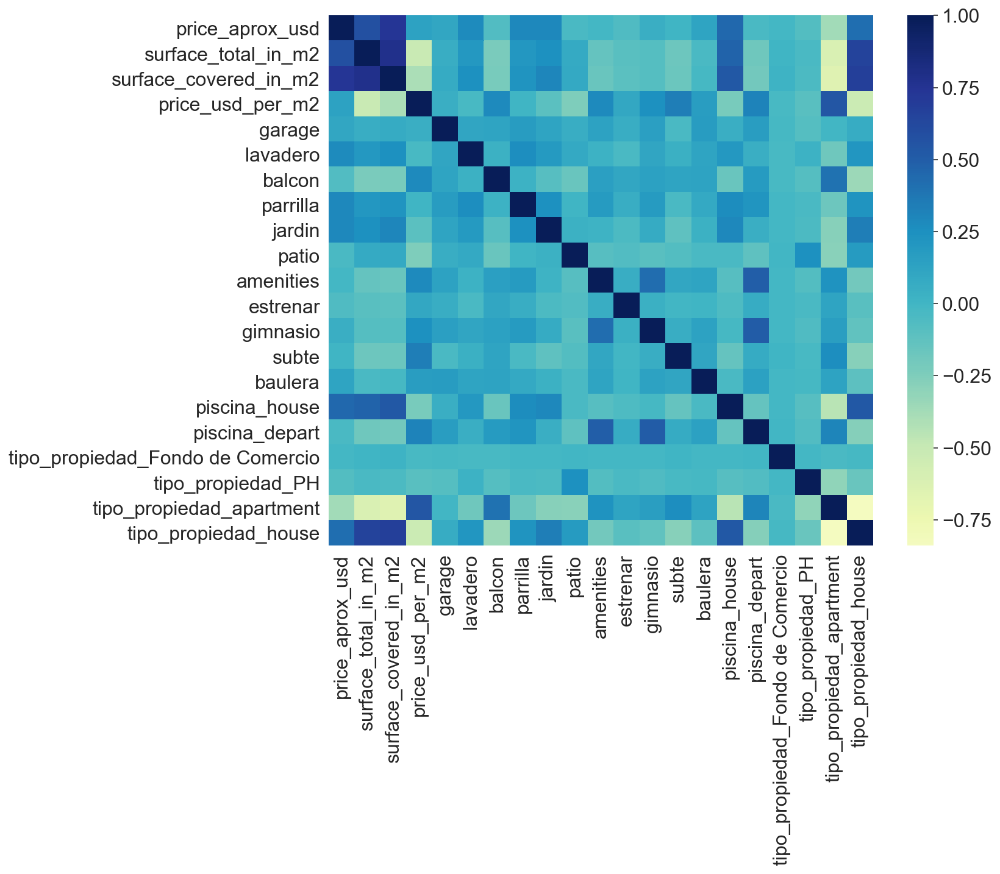

In [221]:
sns.heatmap(preciosNormalizados[feature_cols].corr(), center=0, cmap="YlGnBu", annot=False);

<hr>

## model_train_test_error

In [127]:
# Esta función recibe el modelo ya instanciado con los hiperparámetros, el dataframe, 
# los nombres de las columnas predictoras y el nombre de la columna que quiero predecir
def model_train_test_error(modelo, df, feature_cols, columna_predecir):
    X = df[feature_cols]
    y = df[columna_predecir]
    X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.30, random_state=42)
    modelo_fit = modelo.fit(X_train, y_train)
    y_pred = modelo.predict(X_test)
    print (feature_cols)
    print ("y_test sample: ",y_test.values[0:10])
    print ("y_pred sample: ",y_pred[0:10].astype(int))
    print ('Metrics.MAE:', metrics.mean_absolute_error(y_test, y_pred))
    print ('Metrics.MSE:', metrics.mean_squared_error(y_test, y_pred))
    print ('Metrics.RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print ('Metrics.R2:', metrics.r2_score(y_test, y_pred))
    print ("Modelo_fit.r^2:", modelo_fit.score(X_test, y_test))    
    print ('Modelo_fit.Score test: ', modelo_fit.score(X_test, y_test))
    print ('Modelo_fit.Score train: ', modelo_fit.score(X_train, y_train))
    print ("Modelo_fit.coef: ", modelo_fit.coef_)
    if hasattr(modelo, 'alpha_'):    
        print("Alpha: ", modelo_fit.alpha_)

    #fig, ax = plt.subplots()
    #ax.scatter(y_test, y_pred, edgecolors=(0, 0, 0))
    #ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
    #ax.set_xlabel('Measured')
    #ax.set_ylabel('Predicted')
    #plt.show()        
        
    print ()
    return

In [256]:
preciosNormalizados.columns.values

array(['País', 'Provincia', 'Área', 'Localidad', 'Zona', 'Lugar',
       'price_aprox_usd', 'surface_total_in_m2', 'surface_covered_in_m2',
       'price_usd_per_m2', 'garage', 'lavadero', 'balcon', 'parrilla',
       'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte',
       'baulera', 'piscina_house', 'piscina_depart',
       'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH',
       'tipo_propiedad_apartment', 'tipo_propiedad_house',
       'Lugar__ Country Maschwitz Club', 'Lugar__ los alamos',
       'Lugar__9 de Abril', 'Lugar__Abasto', 'Lugar__Abril Club de Campo',
       'Lugar__Acacias Blancas', 'Lugar__Acassuso', 'Lugar__Achiras',
       'Lugar__Adrogué', 'Lugar__Aeropuerto Internacional Ezeiza',
       'Lugar__Agronomía', 'Lugar__Agua Blanca', 'Lugar__Agua de Oro',
       'Lugar__Aguas Verdes', 'Lugar__Albanueva Barrio Cerrado',
       'Lugar__Aldea Brasilera', 'Lugar__Aldo Bonzi',
       'Lugar__Alejandro Korn', 'Lugar__Alem', 'Lugar__Almafuerte',
       '

In [252]:
property_type_dummies = pd.get_dummies(preciosNormalizados["Lugar"], columns=["Lugar"], prefix="Lugar_")
preciosNormalizados = pd.concat([preciosNormalizados, property_type_dummies], axis=1)

In [254]:
preciosNormalizados = preciosNormalizados.drop(columns="Lugar__coordenadas 34.255511")

In [255]:
preciosNormalizados

,País,Provincia,Área,Localidad,Zona,Lugar,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,...,Lugar__Village Golf & Tennis Country Club,Lugar__Villars,Lugar__Virasoro Village,Lugar__Virrey del Pino,Lugar__Virreyes,Lugar__Wilde,Lugar__William Morris,Lugar__Yerba Buena,Lugar__Zelaya,Lugar__Zárate
0,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,62000.0,55.0,40.0,1127.272727,...,0,0,0,0,0,0,0,0,0,0
2,Argentina,Capital Federal,Capital Federal,Mataderos,Mataderos,Mataderos,72000.0,55.0,55.0,1309.090909,...,0,0,0,0,0,0,0,0,0,0
4,Argentina,Buenos Aires,Costa Atlántica,Mar del Plata,Mar del Plata,Centro,64000.0,35.0,35.0,1828.571429,...,0,0,0,0,0,0,0,0,0,0
6,Argentina,Buenos Aires,Zona Norte,Vicente López,Vicente López,Munro,130000.0,106.0,78.0,1226.415094,...,0,0,0,0,0,0,0,0,0,0
7,Argentina,Capital Federal,Capital Federal,Belgrano,Belgrano,Belgrano,138000.0,45.0,40.0,3066.666667,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114026,Argentina,Capital Federal,Capital Federal,Recoleta,Recoleta,Recoleta,165000.0,44.0,39.0,3750.000000,...,0,0,0,0,0,0,0,0,0,0
114084,Argentina,Buenos Aires,Zona Norte,San Isidro,San Isidro,Beccar,498000.0,360.0,360.0,1383.333333,...,0,0,0,0,0,0,0,0,0,0
114085,Argentina,Capital Federal,Capital Federal,Villa Urquiza,Villa Urquiza,Villa Urquiza,131500.0,46.0,39.0,2858.695652,...,0,0,0,0,0,0,0,0,0,0
114086,Argentina,Buenos Aires,Costa Atlántica,Mar del Plata,Mar del Plata,Plaza Colón,95900.0,48.0,48.0,1997.916667,...,0,0,0,0,0,0,0,0,0,0


In [259]:
#'garage',

col_features = [
'surface_total_in_m2', 'surface_covered_in_m2',
'lavadero', 'balcon', 'parrilla',
'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte',
'baulera', 'piscina_house', 'piscina_depart',
'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH',
'tipo_propiedad_house',
'Lugar__ Country Maschwitz Club', 'Lugar__ los alamos',
       'Lugar__9 de Abril', 'Lugar__Abasto', 'Lugar__Abril Club de Campo',
       'Lugar__Acacias Blancas', 'Lugar__Acassuso', 'Lugar__Achiras',
       'Lugar__Adrogué', 'Lugar__Aeropuerto Internacional Ezeiza',
       'Lugar__Agronomía', 'Lugar__Agua Blanca', 'Lugar__Agua de Oro',
       'Lugar__Aguas Verdes', 'Lugar__Albanueva Barrio Cerrado',
       'Lugar__Aldea Brasilera', 'Lugar__Aldo Bonzi',
       'Lugar__Alejandro Korn', 'Lugar__Alem', 'Lugar__Almafuerte',
       'Lugar__Almagro', 'Lugar__Almirante Brown', 'Lugar__Alta Gracia',
       'Lugar__Altamira', 'Lugar__Altos de Hudson I',
       'Lugar__Altos de Hudson II', 'Lugar__Altos de Manzanares 1 y 2',
       'Lugar__Altos de Matheu', 'Lugar__Altos del Golf',
       'Lugar__Altos del Pilar', 'Lugar__Alvear', 'Lugar__Anisacate',
       'Lugar__Apóstoles', 'Lugar__Arequito',
       'Lugar__Armenia Country Club', 'Lugar__Arroyo Ceibal',
       'Lugar__Arroyo Seco', 'Lugar__Arturo Seguí', 'Lugar__Ascochinga',
       'Lugar__Avellaneda', 'Lugar__Azul', 'Lugar__Bahía Blanca',
       'Lugar__Balcarce', 'Lugar__Balneario San Cayetano',
       'Lugar__Balvanera', 'Lugar__Banfield',
       'Lugar__Barbarita, Barrio Cerrado', 'Lugar__Barracas',
       'Lugar__Barrancas de San Jose', 'Lugar__Barrancas de Santa María',
       'Lugar__Barrio Acacias', 'Lugar__Barrio Alamo Alto',
       'Lugar__Barrio Alto Camet', 'Lugar__Barrio Araucarias',
       'Lugar__Barrio Cabos del Lago', 'Lugar__Barrio Camet',
       'Lugar__Barrio Ceibos', 'Lugar__Barrio Cerrado',
       'Lugar__Barrio Cerrado "Ayres Plaza"',
       'Lugar__Barrio Cerrado "Buenos Aires Village"',
       'Lugar__Barrio Cerrado "El Aromo"',
       'Lugar__Barrio Cerrado "El Casco de Moreno"',
       'Lugar__Barrio Cerrado "El Estribo"',
       'Lugar__Barrio Cerrado "La Candelaria"',
       'Lugar__Barrio Cerrado "La Cautiva del Pilar"',
       'Lugar__Barrio Cerrado "La Cañada de Pilar"',
       'Lugar__Barrio Cerrado "La Chacra"',
       'Lugar__Barrio Cerrado "La Delfina"',
       'Lugar__Barrio Cerrado "La Emilia"',
       'Lugar__Barrio Cerrado "La Montura"',
       'Lugar__Barrio Cerrado "La Tranquera"',
       'Lugar__Barrio Cerrado "Las Araucarias"',
       'Lugar__Barrio Cerrado "Las Marías"',
       'Lugar__Barrio Cerrado "Los Alcanfores"',
       'Lugar__Barrio Cerrado "Los Condes"',
       'Lugar__Barrio Cerrado "Los Fresnos"',
       'Lugar__Barrio Cerrado "Los Ombúes de Hudson"',
       'Lugar__Barrio Cerrado "Los Potrillos"',
       'Lugar__Barrio Cerrado "Los Senderos"',
       'Lugar__Barrio Cerrado "Roble Joven"',
       'Lugar__Barrio Cerrado "Sausalito"',
       'Lugar__Barrio Cerrado "Soles de Pilar"',
       'Lugar__Barrio Cerrado "SpringDale"',
       'Lugar__Barrio Cerrado "Tres Horquetas"',
       'Lugar__Barrio Cerrado El Casco de Alvarez',
       'Lugar__Barrio Cerrado El Lucero',
       'Lugar__Barrio Cerrado Fincas de Maschwitz',
       'Lugar__Barrio Cerrado La Masia',
       'Lugar__Barrio Cerrado Las Casuarinas',
       'Lugar__Barrio Cerrado Los Abedules',
       'Lugar__Barrio Cerrado San Andres', 'Lugar__Barrio El Golf',
       'Lugar__Barrio El Moro', 'Lugar__Barrio El Yacht',
       'Lugar__Barrio Fortunato de La Plaza', 'Lugar__Barrio La Alameda',
       'Lugar__Barrio La Cuesta', 'Lugar__Barrio La Isla',
       'Lugar__Barrio La Perla Norte', 'Lugar__Barrio Las Glorietas',
       'Lugar__Barrio Los Alisos', 'Lugar__Barrio Los Castores',
       'Lugar__Barrio Los Jazmines - Pilar del Este',
       'Lugar__Barrio Los Lagos', 'Lugar__Barrio Los Sauces',
       'Lugar__Barrio Los Tilos', 'Lugar__Barrio Marinas',
       'Lugar__Barrio Melazzi', 'Lugar__Barrio Norte',
       'Lugar__Barrio Parque Almirante Irízar',
       'Lugar__Barrio Parque General San Martin',
       'Lugar__Barrio Parque Matheu', 'Lugar__Barrio Parque San Martin',
       'Lugar__Barrio Privado "Lomas de Fátima"',
       'Lugar__Barrio Privado El Recodo  S.A.',
       'Lugar__Barrio Privado El Resuello',
       'Lugar__Barrio Privado Santa Rita',
       'Lugar__Barrio Privado Villa Olivos', 'Lugar__Barrio San Agustin',
       'Lugar__Barrio San Alfonso - Pilar del Este',
       'Lugar__Barrio San Benito',
       'Lugar__Barrio San Eduardo - Pilar del Este',
       'Lugar__Barrio San Gabriel', 'Lugar__Barrio San Isidro Labrador',
       'Lugar__Barrio San Juan', 'Lugar__Barrio San Marco',
       'Lugar__Barrio San Matías', 'Lugar__Barrio San Rafael',
       'Lugar__Barrio Santa Clara',
       'Lugar__Barrio Santa Guadalupe - Pilar del Este',
       'Lugar__Barrio Santa Teresa', 'Lugar__Barrio Vistas',
       'Lugar__Barrio cerrado La Cascada',
       'Lugar__Barrio cerrado Santa Ana', 'Lugar__BarrioPortezuelo',
       'Lugar__Batán', 'Lugar__Beccar', 'Lugar__Belgrano',
       'Lugar__Bella Vista', 'Lugar__Belén de Escobar',
       'Lugar__Benavidez', 'Lugar__Benavidez Greens',
       'Lugar__Berazategui', 'Lugar__Berazategui Oeste', 'Lugar__Berisso',
       'Lugar__Bermudas Country Club', 'Lugar__Bernal',
       'Lugar__Bernardino Rivadavia', 'Lugar__Bialet Massé',
       'Lugar__Billinghurst', 'Lugar__Boat Center Barrio Cerrado',
       'Lugar__Boca', 'Lugar__Boca Ratón', 'Lugar__Boedo',
       'Lugar__Bosque Peralta Ramos', 'Lugar__Boulogne Sur Mer',
       'Lugar__Brandsen', 'Lugar__Brickland',
       'Lugar__Bs.As. G.B.A. Zona Norte',
       'Lugar__Bs.As. G.B.A. Zona Oeste', 'Lugar__Bs.As. G.B.A. Zona Sur',
       'Lugar__Buena Nueva', 'Lugar__Buenos Aires Costa Atlántica',
       'Lugar__Buenos Aires Interior', 'Lugar__Burzaco',
       'Lugar__Caballito', 'Lugar__Cafayate', 'Lugar__Caisamar',
       'Lugar__Caleta Olivia', 'Lugar__Calmayo', 'Lugar__Camet',
       'Lugar__Campana', 'Lugar__Campo Chico Country Club',
       'Lugar__Campo Grande Country Club', 'Lugar__Campo Quijano',
       'Lugar__Campos de Roca', 'Lugar__Campos de Álvarez',
       'Lugar__Candelaria', 'Lugar__Canning', 'Lugar__Capilla del Monte',
       'Lugar__Capilla del Rosario', 'Lugar__Capital Federal',
       'Lugar__Capitán Bermúdez', 'Lugar__Capitán Sarmiento',
       'Lugar__Carapachay', 'Lugar__Cardales Country Club',
       'Lugar__Cariló', 'Lugar__Carlos Casares',
       'Lugar__Carlos Spegazzini', 'Lugar__Carmel Country Club',
       'Lugar__Carmen de Patagones', 'Lugar__Carpintería',
       'Lugar__Casa Grande', 'Lugar__Caseros', 'Lugar__Castelar',
       'Lugar__Castellanos', 'Lugar__Catalinas', 'Lugar__Catamarca',
       'Lugar__Cañadón Seco', 'Lugar__Cañuelas', 'Lugar__Centenario',
       'Lugar__Centro', 'Lugar__Centro / Microcentro', 'Lugar__Cerrillos',
       'Lugar__Cerro Azul', 'Lugar__Chacarita',
       'Lugar__Chacras de La Trinidad', 'Lugar__Chajarí',
       'Lugar__Chapadmalal', 'Lugar__Chascomús', 'Lugar__Chauvín',
       'Lugar__Chivilcoy', 'Lugar__Choele Choel', 'Lugar__Cipolletti',
       'Lugar__City Bell', 'Lugar__Ciudad Evita',
       'Lugar__Ciudad Jardín Lomas del Palomar', 'Lugar__Ciudadela',
       'Lugar__Claromecó', 'Lugar__Claypole',
       'Lugar__Club El Carmen - Sector casas',
       'Lugar__Club de Campo Aranzazu', 'Lugar__Club de Campo Pueyrredón',
       'Lugar__Coghlan', 'Lugar__Colastiné', 'Lugar__Colegiales',
       'Lugar__Colina de Peralta Ramos', 'Lugar__Colonia Benitez',
       'Lugar__Colonia Caroya', 'Lugar__Colonia Tirolesa', 'Lugar__Colón',
       'Lugar__Comandante Nicanor Otamendi', 'Lugar__Comodoro Rivadavia',
       'Lugar__Concepción del Uruguay', 'Lugar__Concordia',
       'Lugar__Confluencia', 'Lugar__Congreso', 'Lugar__Constitución',
       'Lugar__Coronda', 'Lugar__Coronel Brandsen',
       'Lugar__Coronel Dorrego', 'Lugar__Coronel Suárez',
       'Lugar__Corrientes', 'Lugar__Cosquín', 'Lugar__Costa Azul',
       'Lugar__Costa Esmeralda', 'Lugar__Costa del Este',
       'Lugar__Country Banco Provincia', 'Lugar__Country Club Aranjuez',
       'Lugar__Country Club Las lajas', 'Lugar__Country Golf El Sosiego',
       'Lugar__Country La Tradición', 'Lugar__Country Maschwitz Privado',
       'Lugar__Country Nuevo Quilmes', 'Lugar__Country Saint Thomas',
       'Lugar__Country San Jorge Village', 'Lugar__Crucecita',
       'Lugar__Cruz del Eje', 'Lugar__Cuartel V', 'Lugar__Cushamen',
       'Lugar__Córdoba', 'Lugar__Del Viso', 'Lugar__Delta',
       'Lugar__Derqui', 'Lugar__Despeñaderos', 'Lugar__Dina Huapi',
       'Lugar__Dique Luján', 'Lugar__Dock Sud', 'Lugar__Domselaar',
       'Lugar__Don Bosco', 'Lugar__Don Torcuato', 'Lugar__Dorrego',
       'Lugar__Dunamar', 'Lugar__Echeverría del Lago',
       'Lugar__El Calafate', 'Lugar__El Canton Barrio Islas',
       'Lugar__El Canton Barrio Puerto', 'Lugar__El Cazador',
       'Lugar__El Centauro', 'Lugar__El Dorado', 'Lugar__El Encuentro',
       'Lugar__El Manzano', 'Lugar__El Molino',
       'Lugar__El Nacional Club de Campo', 'Lugar__El Palomar',
       'Lugar__El Pato', 'Lugar__El Pato Country Club', 'Lugar__El Rocío',
       'Lugar__El Sauce', 'Lugar__El Talar', 'Lugar__El Talar de Pacheco',
       'Lugar__El Viejo Vivero', 'Lugar__El Volcán',
       'Lugar__Empalme Lobos', 'Lugar__Empalme Villa Constitución',
       'Lugar__Ensenada', 'Lugar__Enyoi', 'Lugar__Escalante',
       'Lugar__Escobar', 'Lugar__Esperanza', 'Lugar__Esquel',
       'Lugar__Estancias del Pilar', 'Lugar__Esteban Echeverría',
       'Lugar__Etcheverry', 'Lugar__Exaltación de la Cruz',
       'Lugar__Ezeiza', 'Lugar__Ezpeleta', 'Lugar__Faro Norte',
       'Lugar__Fighiera', 'Lugar__Fincas de Hudson',
       'Lugar__Fincas de Iraola', 'Lugar__Fincas de Iraola II',
       'Lugar__Fincas de San Vicente', 'Lugar__Fincas del Lago',
       'Lugar__Florencio Varela', 'Lugar__Flores', 'Lugar__Floresta',
       'Lugar__Florida', 'Lugar__Florida Oeste',
       'Lugar__Francisco Alvarez', 'Lugar__Franck',
       'Lugar__Fray Luis Beltrán', 'Lugar__Funes', 'Lugar__Fátima',
       'Lugar__Galapagos Country Club', 'Lugar__Garupá', 'Lugar__Garín',
       'Lugar__General Alvarado', 'Lugar__General Alvear',
       'Lugar__General Cabrera', 'Lugar__General Las Heras',
       'Lugar__General Madariaga', 'Lugar__General Pacheco',
       'Lugar__General Pico', 'Lugar__General Pinto',
       'Lugar__General Pueyrredón', 'Lugar__General Roca',
       'Lugar__General Rodríguez', 'Lugar__General San Martín',
       'Lugar__Gerli', 'Lugar__Glew', 'Lugar__Gobernador Benegas',
       'Lugar__Godoy Cruz', 'Lugar__Golf Club Argentino',
       "Lugar__Golfer's Country Club", 'Lugar__González Catán',
       'Lugar__Granadero Baigorria', 'Lugar__Grand Bourg',
       'Lugar__GreenVille Polo & Resort', 'Lugar__Gregorio de Laferrere',
       'Lugar__Gualeguaychú', 'Lugar__Guernica',
       'Lugar__Guillermo Hudson', 'Lugar__Gálvez', 'Lugar__Güemes',
       'Lugar__Güer Aike', 'Lugar__Hacoaj Barrio Cerrado', 'Lugar__Haedo',
       'Lugar__Haras María Elena', 'Lugar__Haras María Victoria',
       'Lugar__Haras San Pablo', 'Lugar__Haras Santa Maria',
       'Lugar__Haras del Pilar - El Establo',
       'Lugar__Haras del Pilar - La Caballeriza',
       'Lugar__Haras del Pilar - Las Praderas 1 y 2',
       'Lugar__Haras del Sur I', 'Lugar__Haras del Sur II',
       'Lugar__Hermitage', 'Lugar__Hernando',
       'Lugar__Highland Park Country Club', 'Lugar__Hindu Club',
       'Lugar__Huerta Grande', 'Lugar__Hurlingham', 'Lugar__Ibarlucea',
       'Lugar__Indio Cuá Country Club',
       'Lugar__Ingeniero Adolfo Sourdeaux', 'Lugar__Ingeniero Juan Allan',
       'Lugar__Ingeniero Pablo Nogués', 'Lugar__Iriondo',
       'Lugar__Isidro Casanova', 'Lugar__Islas', 'Lugar__Islas del Canal',
       'Lugar__Ituzaingó', 'Lugar__Jesús María',
       'Lugar__Jose Leon Suarez', 'Lugar__Jose Marmol',
       'Lugar__José C Paz', 'Lugar__José Hernández',
       'Lugar__José Ingenieros', 'Lugar__Juana Koslay',
       'Lugar__Junin de los Andes', 'Lugar__Junín', 'Lugar__Juramento',
       'Lugar__La Agustina', 'Lugar__La Angélica', 'Lugar__La Calera',
       'Lugar__La Caleta', 'Lugar__La Cesarina', 'Lugar__La Comarca',
       'Lugar__La Cumbre', 'Lugar__La Escondida de Manzanares',
       'Lugar__La Falda', 'Lugar__La Granja', 'Lugar__La Herradura',
       'Lugar__La Lomada de Pilar', 'Lugar__La Lonja', 'Lugar__La Lucila',
       'Lugar__La Lucila del Mar', 'Lugar__La Madrugada',
       'Lugar__La Martinica', 'Lugar__La Matanza', 'Lugar__La Paz',
       'Lugar__La Peregrina', 'Lugar__La Perla', 'Lugar__La Pilarica',
       'Lugar__La Plata', 'Lugar__La Punta', 'Lugar__La Ranita',
       'Lugar__La Reja', 'Lugar__La Rioja', 'Lugar__La Tablada',
       'Lugar__La Unión', 'Lugar__La horqueta de Echeverría',
       'Lugar__Laboulaye', 'Lugar__Laguna del Sol', 'Lugar__Lanús',
       'Lugar__Lanús Este', 'Lugar__Lanús Oeste', 'Lugar__Laprida',
       'Lugar__Larena Country Club', 'Lugar__Las Calles',
       'Lugar__Las Cañitas', 'Lugar__Las Gaviotas',
       'Lugar__Las Golondrinas', 'Lugar__Las Grutas', 'Lugar__Las Heras',
       'Lugar__Las Rosas', 'Lugar__Las Toninas', 'Lugar__Libertad',
       'Lugar__Liniers', 'Lugar__Lisandro Olmos', 'Lugar__Llavallol',
       'Lugar__Lobería', 'Lugar__Lobos', 'Lugar__Loma Hermosa',
       'Lugar__Loma Verde', 'Lugar__Lomas de Benavidez',
       'Lugar__Lomas de Zamora', 'Lugar__Lomas del Mirador',
       'Lugar__Longchamps', 'Lugar__Los Acantilados',
       'Lugar__Los Angeles Village', 'Lugar__Los Cardales',
       'Lugar__Los Cocos', 'Lugar__Los Horneros CC',
       'Lugar__Los Hornillos', 'Lugar__Los Hornos',
       'Lugar__Los Lagartos Country Club', 'Lugar__Los Laureles',
       'Lugar__Los Molinos', 'Lugar__Los Pilares - Barrio Privado',
       'Lugar__Los Pinares', 'Lugar__Los Polvorines',
       'Lugar__Los Reartes', 'Lugar__Los Robles de Maschwitz',
       'Lugar__Los Tres Coniles', 'Lugar__Los Troncos',
       'Lugar__Luis Guillón', 'Lugar__Luján', 'Lugar__Luján de Cuyo',
       'Lugar__Luque', 'Lugar__Lácar', 'Lugar__Macrocentro',
       'Lugar__Maipú', 'Lugar__Malabrigo', 'Lugar__Malagueño',
       'Lugar__Malargüe', 'Lugar__Malvinas Argentinas',
       'Lugar__Manantiales', 'Lugar__Manfredi', 'Lugar__Manuel Alberti',
       'Lugar__Manuel B Gonnet', 'Lugar__Manzanares',
       'Lugar__Mapuche Country Club', 'Lugar__Maquinista Savio',
       'Lugar__Mar Azul', 'Lugar__Mar Chiquita', 'Lugar__Mar de Ajó',
       'Lugar__Mar de Cobo', 'Lugar__Mar de las Pampas',
       'Lugar__Mar del Plata', 'Lugar__Mar del Sur',
       'Lugar__Mar del Tuyú', 'Lugar__Marcos Paz',
       'Lugar__Mariano Acosta', 'Lugar__Marinas Golf Barrio Cerrado',
       'Lugar__Martindale Country Club', 'Lugar__Martín Coronado',
       'Lugar__Martínez', 'Lugar__María Grande', 'Lugar__María Juana',
       'Lugar__Maschwitz', 'Lugar__Mataderos', 'Lugar__Matheu',
       'Lugar__Mayling Club de Campo', 'Lugar__Mayu Sumaj',
       'Lugar__Mburucuyá', 'Lugar__Medal Country Club',
       'Lugar__Melchor Romero', 'Lugar__Mendiolaza', 'Lugar__Mendoza',
       'Lugar__Mercedes', 'Lugar__Merlo', 'Lugar__Mi Refugio',
       'Lugar__Mina Clavero', 'Lugar__Ministro Rivadavia',
       'Lugar__Miraflores Country Club', 'Lugar__Miramar',
       'Lugar__Misiones', 'Lugar__Monserrat', 'Lugar__Monte Castro',
       'Lugar__Monte Chingolo', 'Lugar__Monte Grande',
       'Lugar__Monte Hermoso', 'Lugar__Moreno', 'Lugar__Morón',
       'Lugar__Mundialista', 'Lugar__Munro', 'Lugar__Muñiz',
       'Lugar__Máximo Paz', 'Lugar__Naposta', 'Lugar__Navarro',
       'Lugar__Necochea', 'Lugar__Nelson', 'Lugar__Neuquén',
       'Lugar__Nono', 'Lugar__Nordelta', 'Lugar__Nueva Atlantis',
       'Lugar__Nuñez', 'Lugar__Oberá', 'Lugar__Obispo Trejo',
       'Lugar__Oliva', 'Lugar__Olivera', 'Lugar__Oliveros',
       'Lugar__Olivos', 'Lugar__Olivos Golf Club', 'Lugar__Oncativo',
       'Lugar__Once', 'Lugar__Open Door', 'Lugar__Oro Verde',
       'Lugar__Ostende', 'Lugar__Pablo Podestá', 'Lugar__Palermo',
       'Lugar__Palermo Chico', 'Lugar__Palermo Hollywood',
       'Lugar__Palermo Soho', 'Lugar__Palermo Viejo',
       'Lugar__Pampa del Infierno', 'Lugar__Paraná',
       'Lugar__Parque Avellaneda', 'Lugar__Parque Centenario',
       'Lugar__Parque Chacabuco', 'Lugar__Parque Chas',
       'Lugar__Parque Leloir', 'Lugar__Parque Luro',
       'Lugar__Parque Patricios', 'Lugar__Paso de la Patria',
       'Lugar__Paso de los Libres', 'Lugar__Paso del Rey',
       'Lugar__Paternal', 'Lugar__Pehuajó', 'Lugar__Pergamino',
       'Lugar__Pilar', 'Lugar__Pilar Golf Country Club',
       'Lugar__Pilar Green Park', 'Lugar__Pilar Village',
       'Lugar__Pilar del Lago', 'Lugar__Pinamar',
       'Lugar__Pinos de Anchorena', 'Lugar__Piñeiro', 'Lugar__Platanos',
       'Lugar__Playa Chica', 'Lugar__Playa Grande', 'Lugar__Playa Serena',
       'Lugar__Playa Varese', 'Lugar__Plaza Colón', 'Lugar__Plaza Mitre',
       'Lugar__Plaza Rocha', 'Lugar__Plottier', 'Lugar__Pompeya',
       'Lugar__Pontevedra', 'Lugar__Posadas', 'Lugar__Potrero de Garay',
       'Lugar__Potrero de los Funes', 'Lugar__Prados del Oeste',
       'Lugar__Presidencia Roque Sáenz Peña', 'Lugar__Presidente Perón',
       'Lugar__Pueblo Esther', 'Lugar__Puerto', 'Lugar__Puerto Esperanza',
       'Lugar__Puerto Iguazú', 'Lugar__Puerto Madero', 'Lugar__Punilla',
       'Lugar__Punta Alta', 'Lugar__Punta Iglesia', 'Lugar__Punta Indio',
       'Lugar__Punta Lara', 'Lugar__Punta Mogotes', 'Lugar__Pérez',
       'Lugar__QBay Yacht', 'Lugar__Quemú Quemú', 'Lugar__Quilmes',
       'Lugar__Rada Tilly', 'Lugar__Rafael Calzada',
       'Lugar__Rafael Castillo', 'Lugar__Rafaela', 'Lugar__Ramos Mejía',
       'Lugar__Ranelagh', 'Lugar__Rawson', 'Lugar__Recoleta',
       'Lugar__Reconquista', 'Lugar__Recreo',
       'Lugar__Remedios de Escalada', 'Lugar__Resistencia', 'Lugar__Reta',
       'Lugar__Retiro', 'Lugar__Ricardo Rojas', 'Lugar__Ricardone',
       'Lugar__Rincon', 'Lugar__Rincón de Maschwitz',
       'Lugar__Rincón de Milberg', 'Lugar__Rincón de la Costa',
       'Lugar__Rincón de los Sauces', 'Lugar__Ringuelet',
       'Lugar__Rodeo de la Cruz', 'Lugar__Roldán', 'Lugar__Roosevelt',
       'Lugar__Rosario', 'Lugar__Rumenco', 'Lugar__Río Ceballos',
       'Lugar__Río Cuarto', 'Lugar__Río Grande', 'Lugar__Río Negro',
       'Lugar__Río Primero', 'Lugar__Río Segundo', 'Lugar__Río Tercero',
       'Lugar__Río de Los Sauces', 'Lugar__Saavedra', 'Lugar__Saldán',
       'Lugar__Salsipuedes', 'Lugar__Salta', 'Lugar__Salvador María',
       'Lugar__San Alberto', 'Lugar__San Andres',
       'Lugar__San Andrés de Giles', 'Lugar__San Antonio',
       'Lugar__San Antonio De Padua', 'Lugar__San Antonio de Areco',
       'Lugar__San Antonio de Arredondo', 'Lugar__San Benito',
       'Lugar__San Bernardo', 'Lugar__San Carlos',
       'Lugar__San Carlos Centro', 'Lugar__San Carlos de Bariloche',
       'Lugar__San Clemente del Tuyú', 'Lugar__San Cristobal',
       'Lugar__San Diego Country Club',
       'Lugar__San Eliseo Country, Golf, Hotel & Spa',
       'Lugar__San Fernando', 'Lugar__San Francisco',
       'Lugar__San Francisco Club de Campo',
       'Lugar__San Francisco Solano', 'Lugar__San Isidro',
       'Lugar__San Jerónimo Norte', 'Lugar__San Jorge', 'Lugar__San Jose',
       'Lugar__San José', 'Lugar__San Juan', 'Lugar__San Justo',
       'Lugar__San Lorenzo', 'Lugar__San Lucas Village',
       'Lugar__San Luis', 'Lugar__San Martín',
       'Lugar__San Martín de los Andes', 'Lugar__San Miguel',
       'Lugar__San Miguel Oeste', 'Lugar__San Miguel de Ghiso',
       'Lugar__San Miguel de Tucumán', 'Lugar__San Miguel del Monte',
       'Lugar__San Nicolás', 'Lugar__San Pedro', 'Lugar__San Rafael',
       'Lugar__San Roque', 'Lugar__San Salvador de Jujuy',
       'Lugar__San Telmo', 'Lugar__San Vicente',
       'Lugar__Santa Barbara Barrio Cerrado', 'Lugar__Santa Catalina',
       'Lugar__Santa Clara del Mar', 'Lugar__Santa Fe',
       'Lugar__Santa Isabel', 'Lugar__Santa María',
       'Lugar__Santa María de los Olivos', 'Lugar__Santa Rosa',
       'Lugar__Santa Rosa de Calamuchita', 'Lugar__Santa Teresita',
       'Lugar__Santa-Catalina', 'Lugar__Santiago Del Estero',
       'Lugar__Santo Tomé', 'Lugar__Santos Lugares', 'Lugar__Sarandi',
       'Lugar__Septiembre', 'Lugar__Sierra de los Padres',
       'Lugar__Solar del Bosque', 'Lugar__Solares del Talar',
       'Lugar__Sourigues', 'Lugar__St. Patrick Country',
       'Lugar__Stella Maris', 'Lugar__Suipacha', 'Lugar__Sáenz Peña',
       'Lugar__Tafí del Valle', 'Lugar__Talar del Lago 1',
       'Lugar__Talar del lago 2', 'Lugar__Tancacha', 'Lugar__Tandil',
       'Lugar__Tanti', 'Lugar__Tapiales', 'Lugar__Temperley',
       'Lugar__Terminal Nueva', 'Lugar__Terminal Vieja',
       'Lugar__Terravista Barrio Privado', 'Lugar__Tierra Del Fuego',
       'Lugar__Tigre', 'Lugar__Tilisarao', 'Lugar__Timbúes',
       'Lugar__Tolosa', 'Lugar__Torres', 'Lugar__Torreón',
       'Lugar__Tortugas Country Club', 'Lugar__Tortuguitas',
       'Lugar__Trenque Lauquen', 'Lugar__Tres Arroyos',
       'Lugar__Tres de Febrero', 'Lugar__Trevelín', 'Lugar__Tribunales',
       'Lugar__Trinidad', 'Lugar__Tristán Suárez',
       'Lugar__Troncos del Talar', 'Lugar__Trujui', 'Lugar__Tucumán',
       'Lugar__Tunuyán', 'Lugar__Turdera', 'Lugar__Unquillo',
       'Lugar__Uribelarrea', 'Lugar__Ushuaia', 'Lugar__Valentín Alsina',
       'Lugar__Valeria del Mar', 'Lugar__Valle Claro',
       'Lugar__Valle Hermoso', 'Lugar__Veinticinco de Mayo',
       'Lugar__Velez Sarsfield', 'Lugar__Versalles', 'Lugar__Verónica',
       'Lugar__Vicente Casares', 'Lugar__Vicente López',
       'Lugar__Victoria', 'Lugar__Viedma',
       'Lugar__Vila Vela Terrazas al Lago', 'Lugar__Villa Adelina',
       'Lugar__Villa Allende', 'Lugar__Villa Amancay',
       'Lugar__Villa Ariza', 'Lugar__Villa Astolfi',
       'Lugar__Villa Ballester', 'Lugar__Villa Bertha',
       'Lugar__Villa Bonich', 'Lugar__Villa Bosch',
       'Lugar__Villa Carlos Paz', 'Lugar__Villa Celina',
       'Lugar__Villa Centenario', 'Lugar__Villa Cerro Azul',
       'Lugar__Villa Ciudad de América', 'Lugar__Villa Constitución',
       'Lugar__Villa Crespo', 'Lugar__Villa Cura Brochero',
       'Lugar__Villa Devoto', 'Lugar__Villa Dolores',
       'Lugar__Villa Dominico', 'Lugar__Villa Elisa',
       'Lugar__Villa Elvira', 'Lugar__Villa Fiorito',
       'Lugar__Villa Fontana', 'Lugar__Villa General Belgrano',
       'Lugar__Villa General Mitre', 'Lugar__Villa Gesell',
       'Lugar__Villa Giardino', 'Lugar__Villa Granaderos De San Martin',
       'Lugar__Villa Icho Cruz', 'Lugar__Villa La Angostura',
       'Lugar__Villa Larca', 'Lugar__Villa Libertad',
       'Lugar__Villa Los Aromos', 'Lugar__Villa Lugano',
       'Lugar__Villa Luro', 'Lugar__Villa Luzuriaga',
       'Lugar__Villa Lynch', 'Lugar__Villa Madero', 'Lugar__Villa Maipu',
       'Lugar__Villa Martelli', 'Lugar__Villa María',
       'Lugar__Villa Mercedes', 'Lugar__Villa Monteagudo',
       'Lugar__Villa Ortuzar', 'Lugar__Villa Pacheco',
       'Lugar__Villa Paranacito', 'Lugar__Villa Parque Santa Ana',
       'Lugar__Villa Parque Siquiman', 'Lugar__Villa Primera',
       'Lugar__Villa Pueyrredón', 'Lugar__Villa Raffo',
       'Lugar__Villa Real', 'Lugar__Villa Riachuelo', 'Lugar__Villa Rosa',
       'Lugar__Villa Rumipal', 'Lugar__Villa Santa Cruz del Lago',
       'Lugar__Villa Santa Rita', 'Lugar__Villa Sarmiento',
       'Lugar__Villa Soldati', 'Lugar__Villa Tesei',
       'Lugar__Villa Udaondo', 'Lugar__Villa Urquiza',
       'Lugar__Villa Vatteone', 'Lugar__Villa de Las Rosas',
       'Lugar__Villa de Mayo', 'Lugar__Villa de Soto',
       'Lugar__Villa del Dique', 'Lugar__Villa del Parque',
       'Lugar__Villa del Totoral',
       'Lugar__Village Golf & Tennis Country Club', 'Lugar__Villars',
       'Lugar__Virasoro Village', 'Lugar__Virrey del Pino',
       'Lugar__Virreyes', 'Lugar__Wilde', 'Lugar__William Morris',
       'Lugar__Yerba Buena', 'Lugar__Zelaya', 'Lugar__Zárate'

]

predecir = "price_usd_per_m2"

In [224]:
preciosNormalizados.Provincia.unique()

array(['Capital Federal', 'Buenos Aires', 'Córdoba', 'Misiones',
       'Entre Ríos', 'Santa Fe', 'Neuquén', 'Río Negro', 'Mendoza',
       'Corrientes', 'Salta', 'Chubut', 'San Luis', 'Tierra Del Fuego',
       'Tucumán', 'Chaco', 'Santa Cruz', 'La Pampa',
       'Santiago Del Estero', 'Catamarca', 'San Juan', 'Jujuy',
       'La Rioja'], dtype=object)

In [213]:
#preciosNormalizados = preciosNormalizados[(preciosNormalizados.Provincia == "Santa Fe")]
#preciosNormalizados

,País,Provincia,Área,Localidad,Zona,Lugar,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,...,estrenar,gimnasio,subte,baulera,piscina_house,piscina_depart,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_apartment,tipo_propiedad_house
148,Argentina,Santa Fe,Santa Fe,Santa Fe,Santa Fe,Santa Fe,67300.41,40.0,40.0,1682.510250,...,0.0,0.0,0.0,0.0,0,0,0,0,1,0
223,Argentina,Santa Fe,Santa Fe,Rosario,Rosario,Rosario,72796.61,36.0,36.0,2022.128056,...,0.0,0.0,0.0,0.0,0,0,0,0,1,0
224,Argentina,Santa Fe,Santa Fe,Rosario,Rosario,Rosario,127422.11,128.0,39.0,995.485234,...,0.0,0.0,0.0,0.0,0,0,0,0,1,0
254,Argentina,Santa Fe,Santa Fe,Rosario,Rosario,Rosario,70104.59,200.0,200.0,350.522950,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
348,Argentina,Santa Fe,Santa Fe,Rosario,Rosario,Rosario,40380.24,29.0,29.0,1392.422069,...,0.0,0.0,0.0,0.0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113936,Argentina,Santa Fe,Santa Fe,Rosario,Rosario,Rosario,320000.00,220.0,220.0,1454.545455,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
113965,Argentina,Santa Fe,Santa Fe,Rosario,Rosario,Rosario,140209.19,100.0,100.0,1402.091900,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
113980,Argentina,Santa Fe,Santa Fe,Rosario,Rosario,Rosario,56083.67,33.0,33.0,1699.505152,...,1.0,0.0,0.0,0.0,0,0,0,0,1,0
113981,Argentina,Santa Fe,Santa Fe,Rosario,Rosario,Rosario,47110.28,27.0,25.0,1744.825185,...,1.0,0.0,0.0,0.0,0,0,0,0,1,0


In [260]:
model_train_test_error(
    linear_model.LinearRegression(), 
    preciosNormalizados, 
    col_features, predecir)

['surface_total_in_m2', 'surface_covered_in_m2', 'lavadero', 'balcon', 'parrilla', 'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte', 'baulera', 'piscina_house', 'piscina_depart', 'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH', 'tipo_propiedad_house', 'Lugar__ Country Maschwitz Club', 'Lugar__ los alamos', 'Lugar__9 de Abril', 'Lugar__Abasto', 'Lugar__Abril Club de Campo', 'Lugar__Acacias Blancas', 'Lugar__Acassuso', 'Lugar__Achiras', 'Lugar__Adrogué', 'Lugar__Aeropuerto Internacional Ezeiza', 'Lugar__Agronomía', 'Lugar__Agua Blanca', 'Lugar__Agua de Oro', 'Lugar__Aguas Verdes', 'Lugar__Albanueva Barrio Cerrado', 'Lugar__Aldea Brasilera', 'Lugar__Aldo Bonzi', 'Lugar__Alejandro Korn', 'Lugar__Alem', 'Lugar__Almafuerte', 'Lugar__Almagro', 'Lugar__Almirante Brown', 'Lugar__Alta Gracia', 'Lugar__Altamira', 'Lugar__Altos de Hudson I', 'Lugar__Altos de Hudson II', 'Lugar__Altos de Manzanares 1 y 2', 'Lugar__Altos de Matheu', 'Lugar__Altos del Golf', 'Lugar__Altos del P

In [241]:
model_train_test_error(
    linear_model.Ridge(alpha=0.5, normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

['surface_total_in_m2', 'surface_covered_in_m2', 'lavadero', 'balcon', 'parrilla', 'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte', 'baulera', 'piscina_house', 'piscina_depart', 'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH', 'tipo_propiedad_house']
y_test sample:  [ 55900.  75000. 288000. 270000. 420000. 560000.  95000. 250000.  95000.
  90000.]
y_pred sample:  [ 83494  72741 257362 268106 369614 385600 126715 225970 233941 164056]
Metrics.MAE: 50942.562569999
Metrics.MSE: 5434914287.922378
Metrics.RMSE: 73721.87116400653
Metrics.R2: 0.6224595297886786
Modelo_fit.r^2: 0.6224595297886786
Modelo_fit.Score test:  0.6224595297886786
Modelo_fit.Score train:  0.6204198751923187
Modelo_fit.coef:  [ 6.56525088e+01  1.10540002e+03  1.54535193e+04  6.24193455e+03
  1.80120552e+04  2.08586627e+04 -1.74478721e+04  9.60772590e+03
  3.48522293e+03  1.12381922e+04  3.00818613e+04  3.43002247e+04
  3.19435841e+04  6.61794792e+03 -9.12645421e+04 -1.69175030e+04
 -4.12464049e+0

In [261]:
model_train_test_error(
    linear_model.Lasso(alpha=0.5, normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

['surface_total_in_m2', 'surface_covered_in_m2', 'lavadero', 'balcon', 'parrilla', 'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte', 'baulera', 'piscina_house', 'piscina_depart', 'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH', 'tipo_propiedad_house', 'Lugar__ Country Maschwitz Club', 'Lugar__ los alamos', 'Lugar__9 de Abril', 'Lugar__Abasto', 'Lugar__Abril Club de Campo', 'Lugar__Acacias Blancas', 'Lugar__Acassuso', 'Lugar__Achiras', 'Lugar__Adrogué', 'Lugar__Aeropuerto Internacional Ezeiza', 'Lugar__Agronomía', 'Lugar__Agua Blanca', 'Lugar__Agua de Oro', 'Lugar__Aguas Verdes', 'Lugar__Albanueva Barrio Cerrado', 'Lugar__Aldea Brasilera', 'Lugar__Aldo Bonzi', 'Lugar__Alejandro Korn', 'Lugar__Alem', 'Lugar__Almafuerte', 'Lugar__Almagro', 'Lugar__Almirante Brown', 'Lugar__Alta Gracia', 'Lugar__Altamira', 'Lugar__Altos de Hudson I', 'Lugar__Altos de Hudson II', 'Lugar__Altos de Manzanares 1 y 2', 'Lugar__Altos de Matheu', 'Lugar__Altos del Golf', 'Lugar__Altos del P

In [249]:
model_train_test_error(
    linear_model.ElasticNet(alpha=0.5, normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

['surface_total_in_m2', 'surface_covered_in_m2', 'lavadero', 'balcon', 'parrilla', 'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte', 'baulera', 'piscina_house', 'piscina_depart', 'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH', 'tipo_propiedad_house']
y_test sample:  [ 55900.  75000. 288000. 270000. 420000. 560000.  95000. 250000.  95000.
  90000.]
y_pred sample:  [ 89923 107350 286701 227263 359147 378580 112776 236862 264040 174667]
Metrics.MAE: 52192.78122248767
Metrics.MSE: 5767893380.163901
Metrics.RMSE: 75946.64824838488
Metrics.R2: 0.5993288829384114
Modelo_fit.r^2: 0.5993288829384114
Modelo_fit.Score test:  0.5993288829384114
Modelo_fit.Score train:  0.5964560113938914
Modelo_fit.coef:  [    33.7310435    1099.35283216   9736.22942733   7997.4074616
  11099.5110844    7046.51945635  -9967.30625648   6225.93289875
   1535.80829961   6098.1977405   13518.66079286  11106.44480276
   6286.77141147   7717.13598492   -289.06292315  -2862.28178044
 -11241.106077

In [144]:
model_train_test_error(
    linear_model.RidgeCV(alphas=np.linspace(0.01, 100, 1000), cv=3, normalize=False,scoring='r2'), 
    preciosNormalizados, 
    col_features, predecir)

['surface_total_in_m2', 'surface_covered_in_m2', 'garage', 'lavadero', 'balcon', 'parrilla', 'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte', 'baulera', 'piscina_house', 'piscina_depart', 'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH', 'tipo_propiedad_house']
y_test sample:  [ 55900.  75000. 288000. 270000. 420000. 560000.  95000. 250000.  95000.
  90000.]
y_pred sample:  [ 83445  72842 257329 268012 369654 385618 126784 226026 233911 163980]
Metrics.MAE: 50940.5228194177
Metrics.MSE: 5435281223.488865
Metrics.RMSE: 73724.35976994893
Metrics.R2: 0.6224340403294213
Modelo_fit.r^2: 0.6224340403294213
Modelo_fit.Score test:  0.6224340403294213
Modelo_fit.Score train:  0.6204180555718153
Modelo_fit.coef:  [ 6.56311845e+01  1.10526967e+03  1.11313403e+02  1.54542618e+04
  6.24363135e+03  1.79983449e+04  2.08415977e+04 -1.74647496e+04
  9.60438196e+03  3.47936647e+03  1.12242469e+04  3.00817260e+04
  3.42620822e+04  3.19255137e+04  6.61067510e+03 -8.63160510e+04
 -1.

In [262]:
model_train_test_error(
    linear_model.LassoCV(alphas=np.linspace(0.01, 100, 10), cv=3, normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

['surface_total_in_m2', 'surface_covered_in_m2', 'lavadero', 'balcon', 'parrilla', 'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte', 'baulera', 'piscina_house', 'piscina_depart', 'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH', 'tipo_propiedad_house', 'Lugar__ Country Maschwitz Club', 'Lugar__ los alamos', 'Lugar__9 de Abril', 'Lugar__Abasto', 'Lugar__Abril Club de Campo', 'Lugar__Acacias Blancas', 'Lugar__Acassuso', 'Lugar__Achiras', 'Lugar__Adrogué', 'Lugar__Aeropuerto Internacional Ezeiza', 'Lugar__Agronomía', 'Lugar__Agua Blanca', 'Lugar__Agua de Oro', 'Lugar__Aguas Verdes', 'Lugar__Albanueva Barrio Cerrado', 'Lugar__Aldea Brasilera', 'Lugar__Aldo Bonzi', 'Lugar__Alejandro Korn', 'Lugar__Alem', 'Lugar__Almafuerte', 'Lugar__Almagro', 'Lugar__Almirante Brown', 'Lugar__Alta Gracia', 'Lugar__Altamira', 'Lugar__Altos de Hudson I', 'Lugar__Altos de Hudson II', 'Lugar__Altos de Manzanares 1 y 2', 'Lugar__Altos de Matheu', 'Lugar__Altos del Golf', 'Lugar__Altos del P

In [146]:
model_train_test_error(
    linear_model.ElasticNetCV(alphas=np.linspace(0.01, 100, 1000), cv=3, normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

['surface_total_in_m2', 'surface_covered_in_m2', 'garage', 'lavadero', 'balcon', 'parrilla', 'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte', 'baulera', 'piscina_house', 'piscina_depart', 'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH', 'tipo_propiedad_house']
y_test sample:  [ 55900.  75000. 288000. 270000. 420000. 560000.  95000. 250000.  95000.
  90000.]
y_pred sample:  [ 83584  75623 259297 265667 368833 384200 126619 227323 235959 162960]
Metrics.MAE: 50894.51847608618
Metrics.MSE: 5443415476.603248
Metrics.RMSE: 73779.50580346312
Metrics.R2: 0.6218689882268617
Modelo_fit.r^2: 0.6218689882268617
Modelo_fit.Score test:  0.6218689882268617
Modelo_fit.Score train:  0.6199595952049155
Modelo_fit.coef:  [    63.31696895   1103.57425981    342.50774155  15362.32709755
   6858.16313233  17771.99738006  19924.9528391  -17739.89839838
   9606.26518994   3379.22251672  10922.30483406  29543.23926953
  32696.43192854  29383.26967762   7225.77500294 -12813.10724612
 -1

<hr>

## model_train_test_error_CrossVal

In [105]:
def model_train_test_error_CrossVal(modelo, df, feature_cols, columna_predecir):
    X = df[feature_cols]
    y = df[columna_predecir]
    X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.30, random_state=42)
    modelo_fit = modelo.fit(X_train, y_train)
    cv = model_selection.KFold(5, shuffle=False)
    scores = model_selection.cross_val_score(modelo, X_train, y_train, cv=cv, scoring='r2')

    if hasattr(modelo, 'alpha_'):
        print(dict(alpha=modelo.alpha_, scores=scores, mean_score=scores.mean(), zero_coefs=(modelo.coef_ == 0).sum()))
    else:
        print("scores: ", scores)
        print("media de scores", scores.mean())
    return 

In [95]:
model_train_test_error_CrossVal(
    linear_model.LinearRegression(), 
    preciosNormalizados, 
    col_features, predecir)

scores:  [0.46091649 0.4509236  0.46657419 0.47021576 0.45935526]
media de scores 0.46159706067427314


In [103]:
model_train_test_error_CrossVal(
    linear_model.RidgeCV(normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

{'alpha': 1.0, 'scores': array([0.46501597, 0.47247732, 0.46042454, 0.46373692, 0.45298573]), 'mean_score': 0.4629280968128824, 'zero_coefs': 0}


In [104]:
model_train_test_error_CrossVal(
    linear_model.LassoCV(normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

{'alpha': 52.481174926989084, 'scores': array([0.33531856, 0.33723372, 0.34030173, 0.34258232, 0.33832053]), 'mean_score': 0.3387513706990252, 'zero_coefs': 13}


In [101]:
model_train_test_error_CrossVal(
    linear_model.ElasticNetCV(normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

{'alpha': 104.11032701338448, 'scores': array([0.24954472, 0.2603183 , 0.25622882, 0.265485  , 0.26152196]), 'mean_score': 0.25861975878926896, 'zero_coefs': 11}


<hr>

## model_train_test_error_CrossValPredict

In [161]:
def model_train_test_error_CrossValPredict(modelo, df, feature_cols, columna_predecir):
    X = df[feature_cols]
    y = df[columna_predecir]
    predicted = model_selection.cross_val_predict(modelo, X, y, cv=10)
    print ('Metrics.R2:', metrics.r2_score(y, predicted))
    fig, ax = plt.subplots()
    ax.scatter(y, predicted, edgecolors=(0, 0, 0))
    ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
    ax.set_xlabel('Measured')
    ax.set_ylabel('Predicted')
    plt.show()

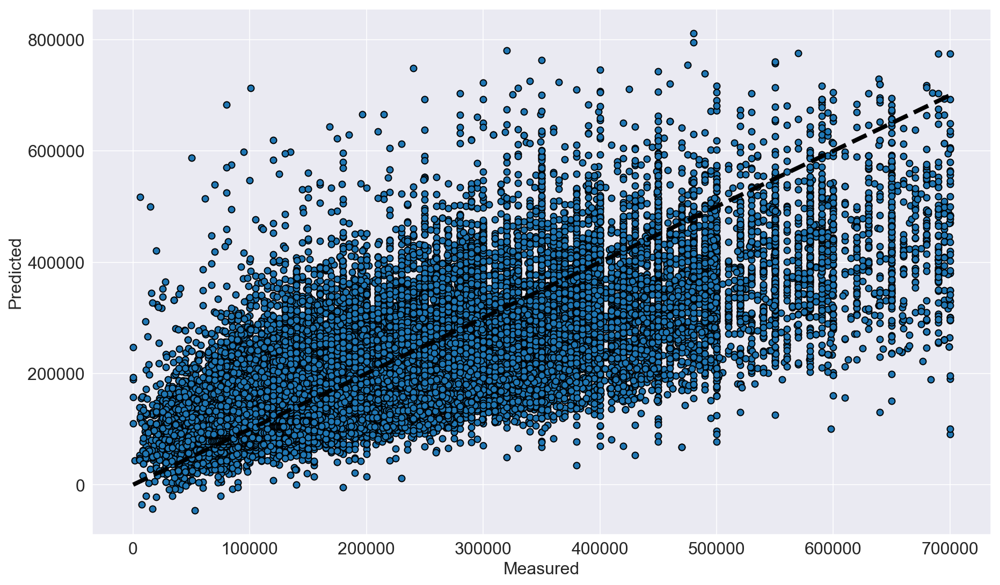

In [154]:
model_train_test_error_CrossValPredict(
    linear_model.LinearRegression(), 
    preciosNormalizados, 
    col_features, predecir)

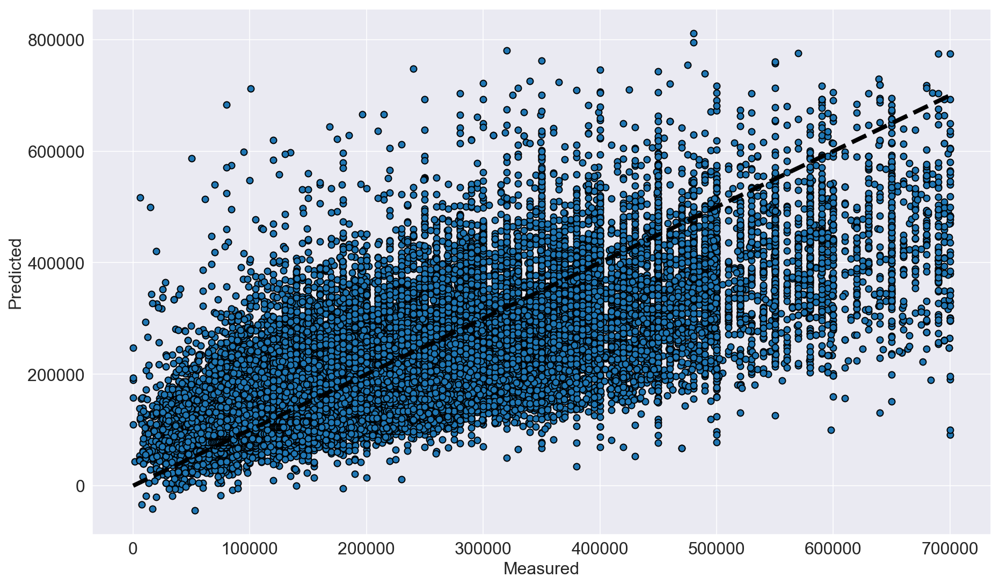

In [155]:
model_train_test_error_CrossValPredict(
    linear_model.RidgeCV(normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

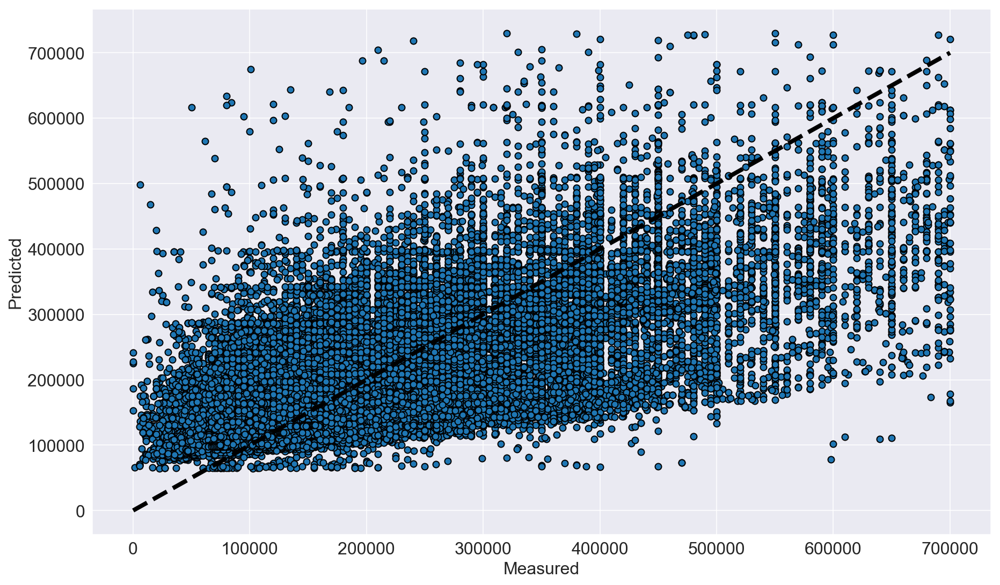

In [156]:
model_train_test_error_CrossValPredict(
    linear_model.LassoCV(normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

Metrics.R2: 0.619034274789812


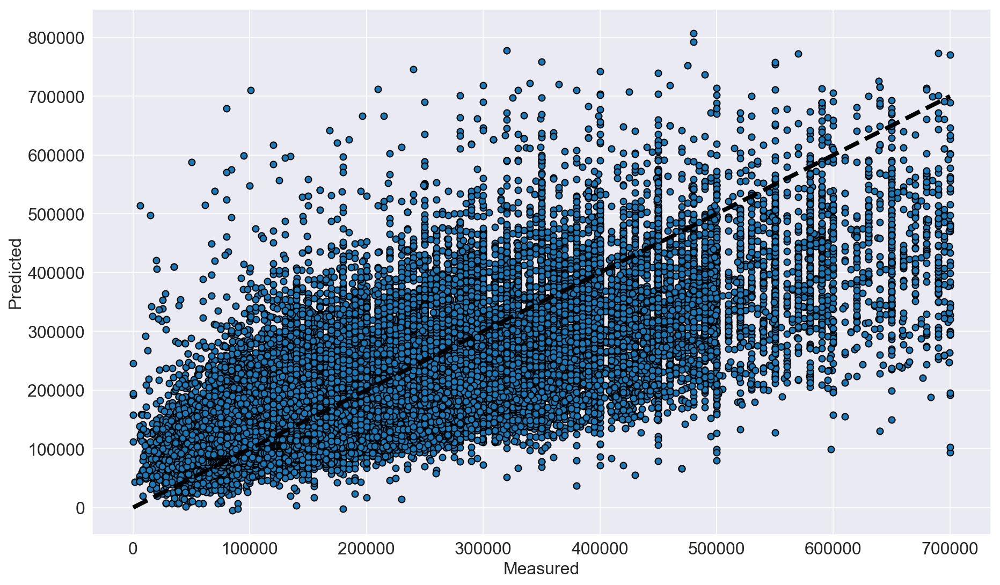

In [163]:
model_train_test_error_CrossValPredict(
    linear_model.ElasticNetCV(alphas=np.linspace(0.01, 100, 20), normalize=False), 
    preciosNormalizados, 
    col_features, predecir)

<hr>

## model_train_test_error_statsmodels

In [147]:
def model_train_test_error_statsmodels(df, feature_cols, columna_predecir):
    X = df[feature_cols]
    y = df[columna_predecir]
    X_constant = sm.add_constant(X)
    modelo = sm.OLS(y, X_constant).fit()
    y_pred = modelo.predict(X_constant)
    print (feature_cols)
    print ('Metrics.MAE:', metrics.mean_absolute_error(y, y_pred))
    print ('Metrics.MSE:', metrics.mean_squared_error(y, y_pred))
    print ('Metrics.RMSE:', np.sqrt(metrics.mean_squared_error(y, y_pred)))
    print (modelo.summary())
    print ()
    return modelo, y, X_constant, X

In [151]:
modeloOLS, yOLS, X_constant, X = model_train_test_error_statsmodels(
    preciosNormalizados, 
    col_features, predecir)

import statsmodels.stats.api as sms
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)

def linearity_test(model, y):
    '''
    funcion para visualizar e identificar supuestos de linealidad sobre la regression lineal
    
    Args:
    * model - fitted OLS model from statsmodels
    * y - observed values
    '''
    fitted_vals = model.predict()
    resids = model.resid

    fig, ax = plt.subplots(1,2)
    
    sns.regplot(x=fitted_vals, y=y, lowess=True, ax=ax[0], line_kws={'color': 'red'})
    ax[0].set_title('Observados vs. Valores Predichos', fontsize=16)
    ax[0].set(xlabel='Predichos', ylabel='Observados')

    sns.regplot(x=fitted_vals, y=resids, lowess=True, ax=ax[1], line_kws={'color': 'red'})
    ax[1].set_title('Residos vs. Valores Predichos', fontsize=16)
    ax[1].set(xlabel='Predichos', ylabel='Residuos')

print ("Linealidad del modelo")
#linearity_test(modeloOLS, yOLS)

['surface_total_in_m2', 'surface_covered_in_m2', 'lavadero', 'balcon', 'parrilla', 'jardin', 'patio', 'amenities', 'estrenar', 'gimnasio', 'subte', 'baulera', 'piscina_house', 'piscina_depart', 'tipo_propiedad_Fondo de Comercio', 'tipo_propiedad_PH', 'tipo_propiedad_house']
Metrics.MAE: 51219.2940468719
Metrics.MSE: 5467369306.162176
Metrics.RMSE: 73941.6615052852
                            OLS Regression Results                            
Dep. Variable:        price_aprox_usd   R-squared:                       0.621
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     7083.
Date:                Wed, 17 Jun 2020   Prob (F-statistic):               0.00
Time:                        21:29:33   Log-Likelihood:            -9.2805e+05
No. Observations:               73480   AIC:                         1.856e+06
Df Residuals:                   73462   BIC:                         1.856e+06
D

In [132]:
# Esperanza de los residuos igual a cero.
modeloOLS.resid.mean()

2.214948838869709e-11

In [152]:
# Sin multicolinealidad (perfecta)
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = [variance_inflation_factor(X_constant.values, i) for i in range(X_constant.shape[1])]
pd.DataFrame({'vif': vif[1:]}, index=X.columns).T

,surface_total_in_m2,surface_covered_in_m2,lavadero,balcon,parrilla,jardin,patio,amenities,estrenar,gimnasio,subte,baulera,piscina_house,piscina_depart,tipo_propiedad_Fondo de Comercio,tipo_propiedad_PH,tipo_propiedad_house
vif,2.781298,3.140356,1.184786,1.214107,1.301342,1.215402,1.170882,1.43282,1.031676,1.455947,1.115516,1.070827,1.623112,1.700029,1.003875,1.176053,2.885793


In [136]:
%config InlineBackend.figure_format ='retina'
import statsmodels.stats.api as sms
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)

def homoscedasticity_test(model):
    '''
    Function for testing the homoscedasticity of residuals in a linear regression model.
    It plots residuals and standardized residuals vs. fitted values and runs Breusch-Pagan and Goldfeld-Quandt tests.
    
    Args:
    * model - fitted OLS model from statsmodels
    '''
    import numpy as np
    fitted_vals = model.predict()
    resids = model.resid
    resids_standardized = model.get_influence().resid_studentized_internal

    fig, ax = plt.subplots(1,2)

    sns.regplot(x=fitted_vals, y=resids, lowess=True, ax=ax[0], line_kws={'color': 'red'})
    ax[0].set_title('Residuals vs Fitted', fontsize=16)
    ax[0].set(xlabel='Fitted Values', ylabel='Residuals')

    sns.regplot(x=fitted_vals, y=np.sqrt(np.abs(resids_standardized)), lowess=True, ax=ax[1], line_kws={'color': 'red'})
    ax[1].set_title('Scale-Location', fontsize=16)
    ax[1].set(xlabel='Fitted Values', ylabel='sqrt(abs(Residuals))')

    bp_test = pd.DataFrame(sms.het_breuschpagan(resids, model.model.exog), 
                           columns=['value'],
                           index=['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value'])

    gq_test = pd.DataFrame(sms.het_goldfeldquandt(resids, model.model.exog)[:-1],
                           columns=['value'],
                           index=['F statistic', 'p-value'])

    print('\n Breusch-Pagan test ----')
    print(bp_test)
    print('\n Goldfeld-Quandt test ----')
    print(gq_test)
    print('\n Residuals plots ----')

print ("Homocedasticidad (varianza igual) de residuos")
homoscedasticity_test(modeloOLS)

Homocedasticidad (varianza igual) de residuos


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001E75B4CA318> (for post_execute):


KeyboardInterrupt: 

Autocorrelación


C:\ProgramData\Anaconda3\envs\dhdsblendv2\lib\site-packages\matplotlib\figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


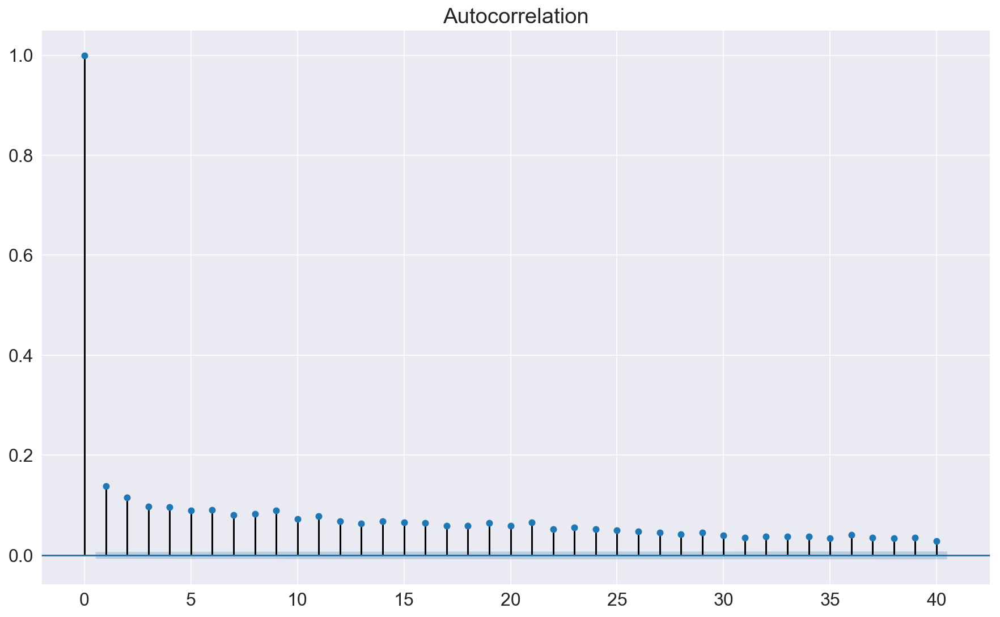

In [153]:
import statsmodels.tsa.api as smt

print ("Autocorrelación")
acf = smt.graphics.plot_acf(modeloOLS.resid, lags=40 , alpha=0.05)
acf.show()

Normalidad de los residuos
Jarque-Bera test ---- statistic: 1045.6974, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.9682, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3113, p-value: 0.0000
Anderson-Darling test ---- statistic: 34.7390, 5% critical value: 0.7860
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 


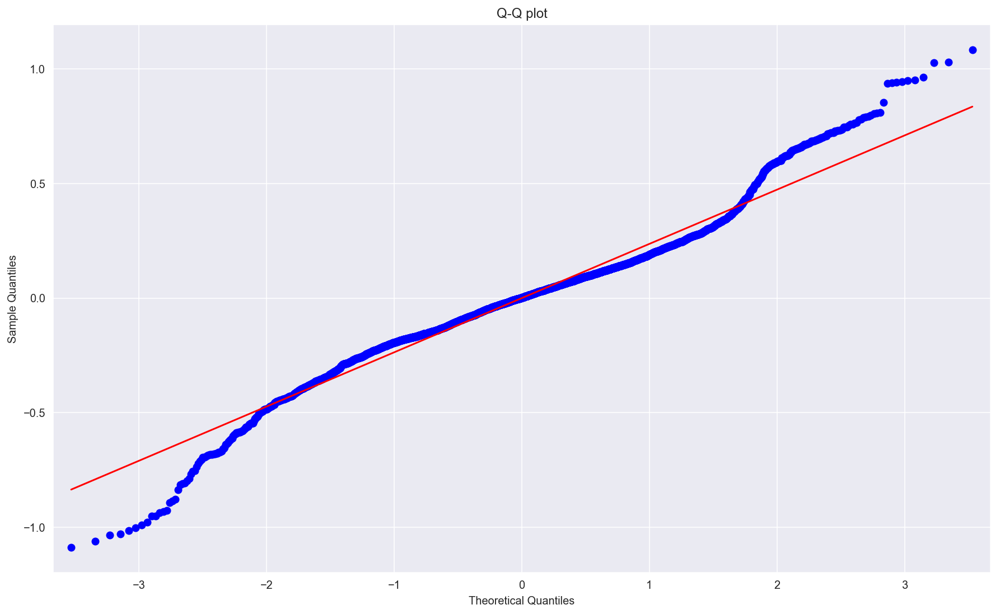

In [37]:
from scipy import stats

def normality_of_residuals_test(model):
    '''
    Function for drawing the normal QQ-plot of the residuals and running 4 statistical tests to 
    investigate the normality of residuals.
    
    Arg:
    * model - fitted OLS models from statsmodels
    '''
    sm.ProbPlot(model.resid).qqplot(line='s');
    plt.title('Q-Q plot');

    jb = stats.jarque_bera(model.resid)
    sw = stats.shapiro(model.resid)
    ad = stats.anderson(model.resid, dist='norm')
    ks = stats.kstest(model.resid, 'norm')
    
    print(f'Jarque-Bera test ---- statistic: {jb[0]:.4f}, p-value: {jb[1]}')
    print(f'Shapiro-Wilk test ---- statistic: {sw[0]:.4f}, p-value: {sw[1]:.4f}')
    print(f'Kolmogorov-Smirnov test ---- statistic: {ks.statistic:.4f}, p-value: {ks.pvalue:.4f}')
    print(f'Anderson-Darling test ---- statistic: {ad.statistic:.4f}, 5% critical value: {ad.critical_values[2]:.4f}')
    print('If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. ')
    
print ("Normalidad de los residuos")
normality_of_residuals_test(modeloOLS)

<hr>

## Gráficos

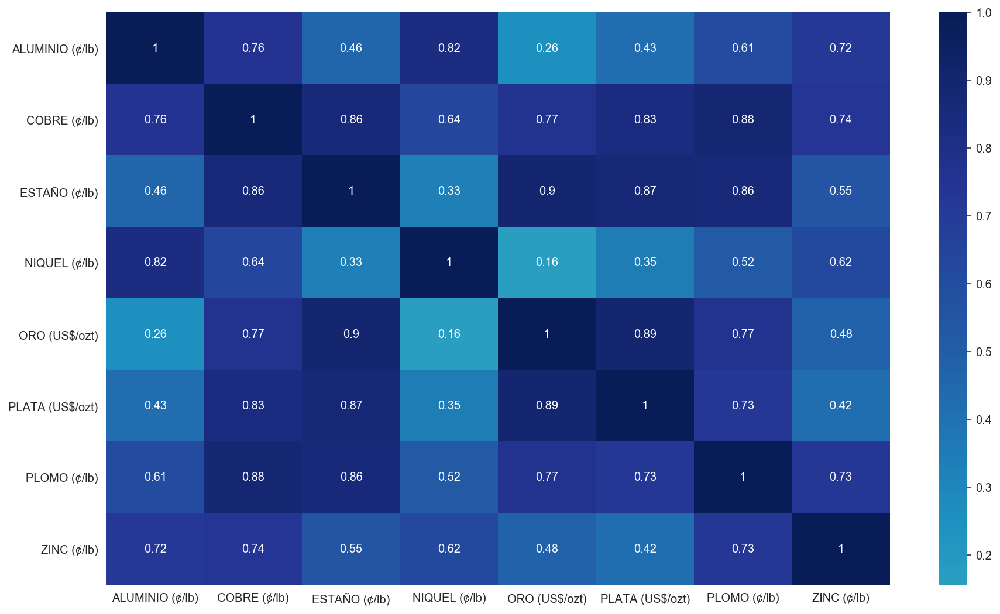

In [38]:
sns.heatmap(preciosNormalizados[feature_cols].corr(), center=0, cmap="YlGnBu", annot=True);

In [251]:
sns.pairplot(preciosNormalizados[feature_cols], height=2.5);

KeyboardInterrupt: 

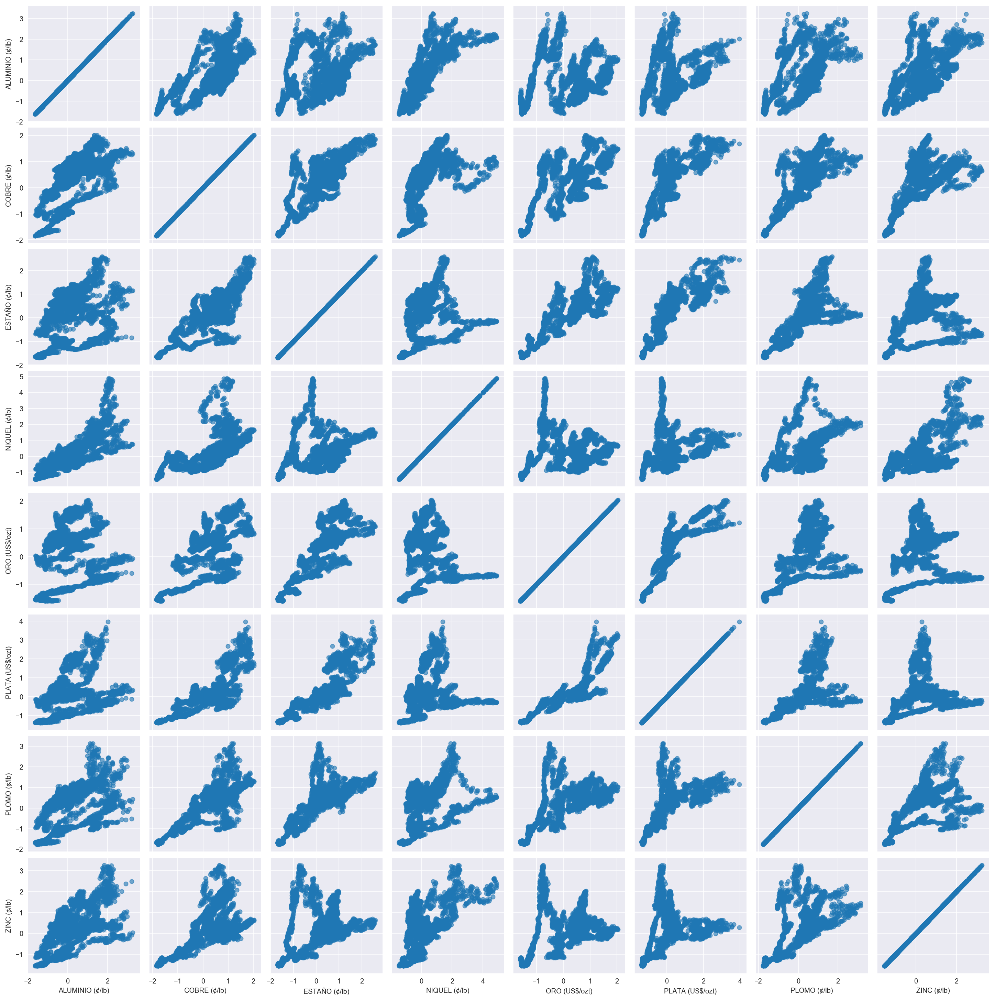

In [40]:
g = sns.PairGrid(preciosNormalizados, vars=feature_cols,
                 palette='deep')
g.map(plt.scatter, alpha=0.6);

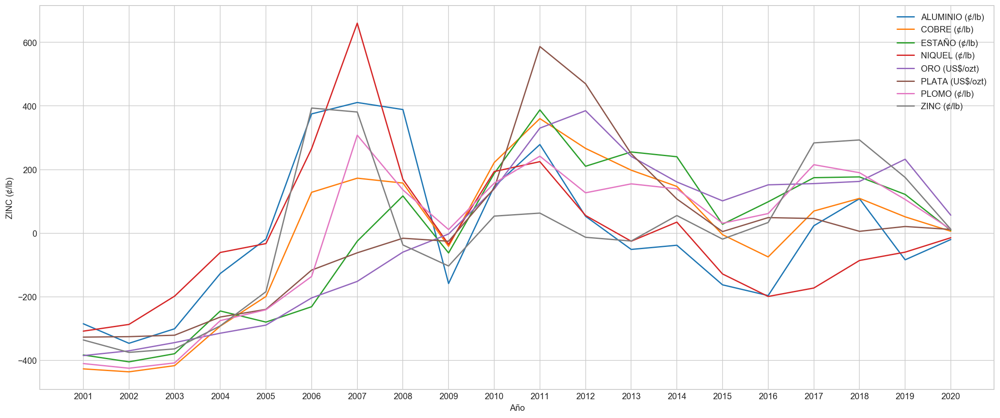

In [41]:
grupos = preciosNormalizados.groupby("Año")
suma_grupos = grupos.sum()
suma_grupos.reset_index(inplace=True)

a4_dims = (20, 8.27)
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots(figsize=a4_dims)

for columna in suma_grupos.columns.values[1:]:
    sns.lineplot(x="Año", y=columna, data=suma_grupos, ax=ax, label=columna);

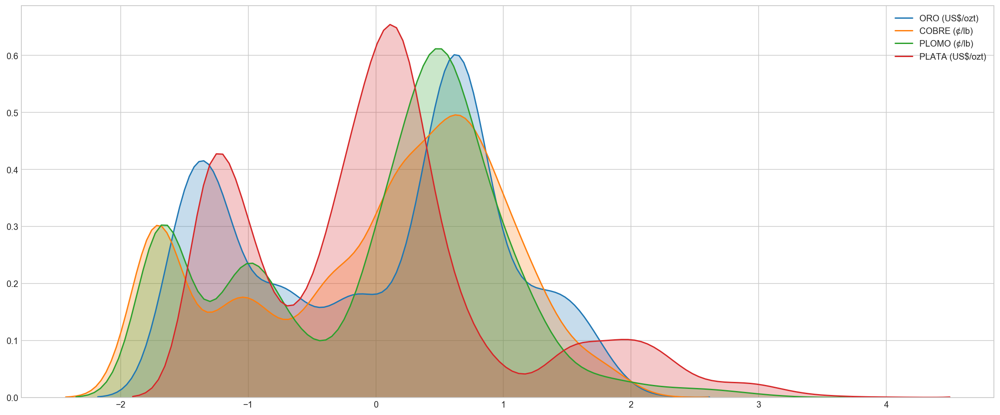

In [42]:
feature_cols_2 = ["ORO (US$/ozt)", "COBRE (¢/lb)", "PLOMO (¢/lb)", "PLATA (US$/ozt)"]

a4_dims = (20, 8.27)
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots(figsize=a4_dims)

for columna in feature_cols_2:
    sns.kdeplot(preciosNormalizados[columna], shade=True, label=columna, ax=ax)

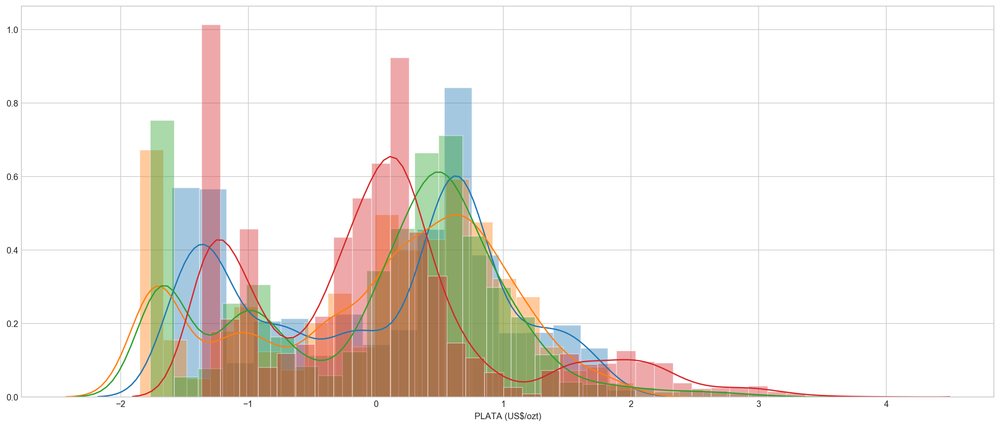

In [43]:
a4_dims = (20, 8.27)
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots(figsize=a4_dims)

for columna in feature_cols_2:
    sns.distplot(preciosNormalizados[columna], label=columna, ax=ax)

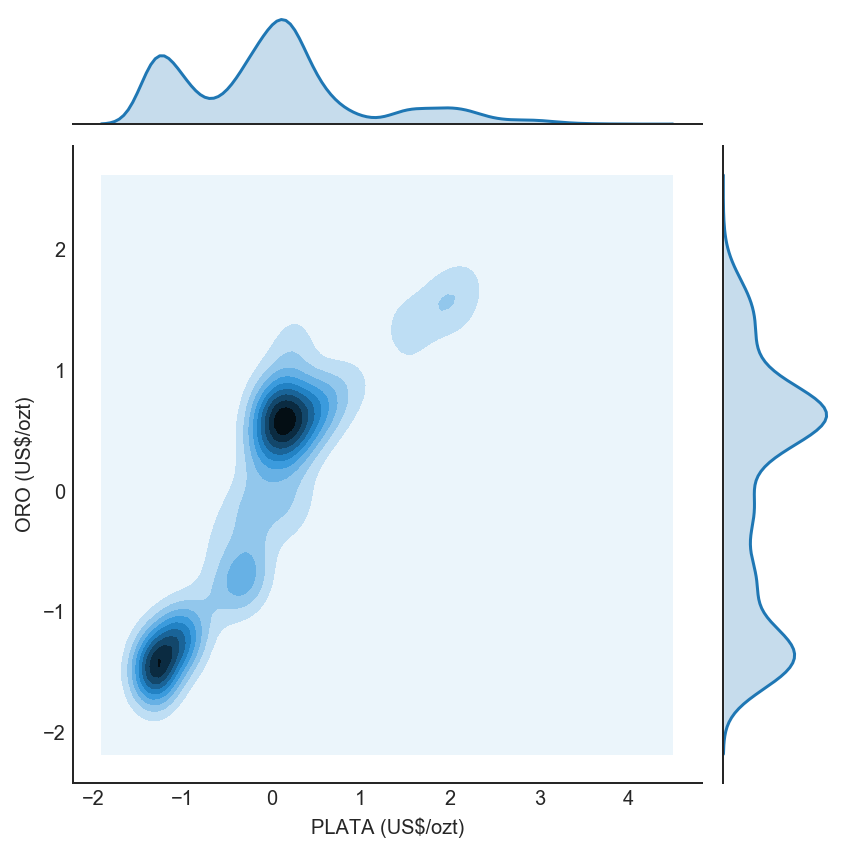

In [44]:
with sns.axes_style('white'):
    sns.jointplot("PLATA (US$/ozt)", "ORO (US$/ozt)", preciosNormalizados, kind='kde');

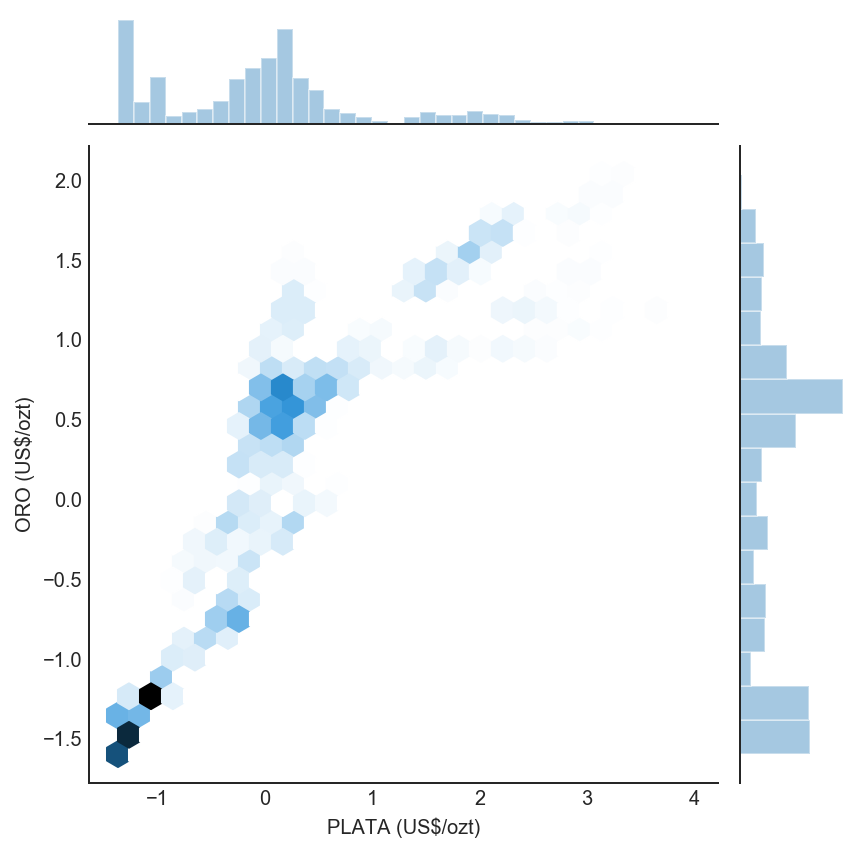

In [45]:
with sns.axes_style('white'):
    sns.jointplot("PLATA (US$/ozt)", "ORO (US$/ozt)", preciosNormalizados, kind='hex')

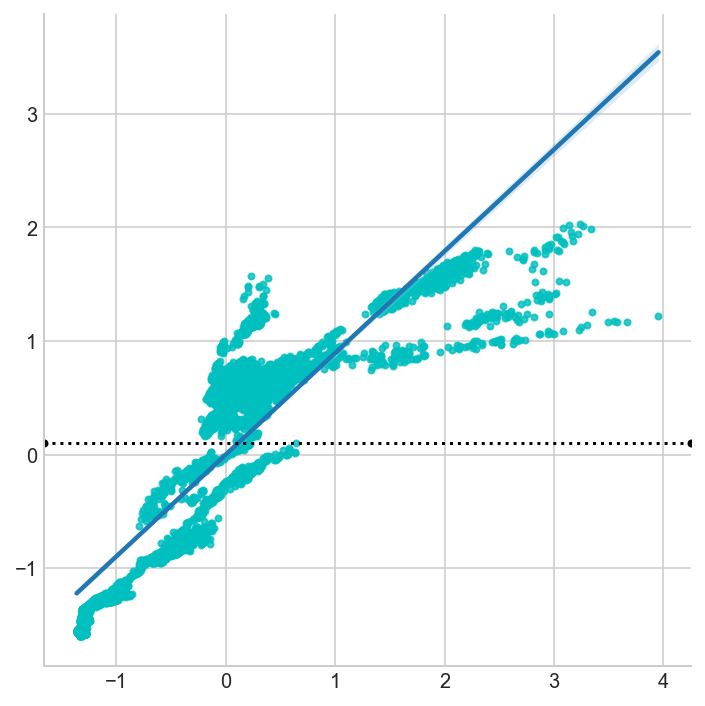

In [46]:
g = sns.lmplot("PLATA (US$/ozt)", "ORO (US$/ozt)", data=preciosNormalizados,
               markers=".", scatter_kws=dict(color='c'))
g.map(plt.axhline, y=0.1, color="k", ls=":");

<hr>

## Gradiente Descendiente

In [47]:
# me genero la rutna de descenso por gradiente
def gradient_descent(X, Y, lr=0.0001, epochs=100000):
    
    '''
    Gradient Descent for a single feature
    '''
    # Building the model
    from sklearn.metrics import mean_squared_error
    import numpy as np
    # defino aleatoriamente los betas.
    beta0 = 100
    beta1 = 100
    # lista para exportar evolucion de beta0 y beta1
    
    beta0_t=[]
    beta1_t=[]
    mse_t=[]
    n = float(len(X)) # Number of elements in X

    # Performing Gradient Descent 
    for _ in range(epochs): 
        # calculo el y pred.
        Y_pred = beta1*X + beta0  # The current predicted value of Y
        # calculo el diferecial para cada beta.
        D_beta1 = (-2/n) * sum(X * (Y - Y_pred))  # Derivative wrt m
        D_beta0 = (-2/n) * sum(Y - Y_pred)  # Derivative wrt c
        # actualizo el valor de beta en cada paso.
        beta1 = beta1 - lr * D_beta1  # Update m
        beta0 = beta0 - lr * D_beta0  # Update c
        mse = mean_squared_error(Y,Y_pred)
        # guardo la evolucion de los betas y la funcion de costo.
        beta0_t.append(beta0)
        beta1_t.append(beta1)
        mse_t.append(mse)
    return beta0,beta1,beta0_t,beta1_t,mse_t

plata = preciosNormalizados["PLATA (US$/ozt)"]
oro = preciosNormalizados["ORO (US$/ozt)"]

intercept,slope,beta0_t,beta1_t,mse_t=gradient_descent(plata,oro)

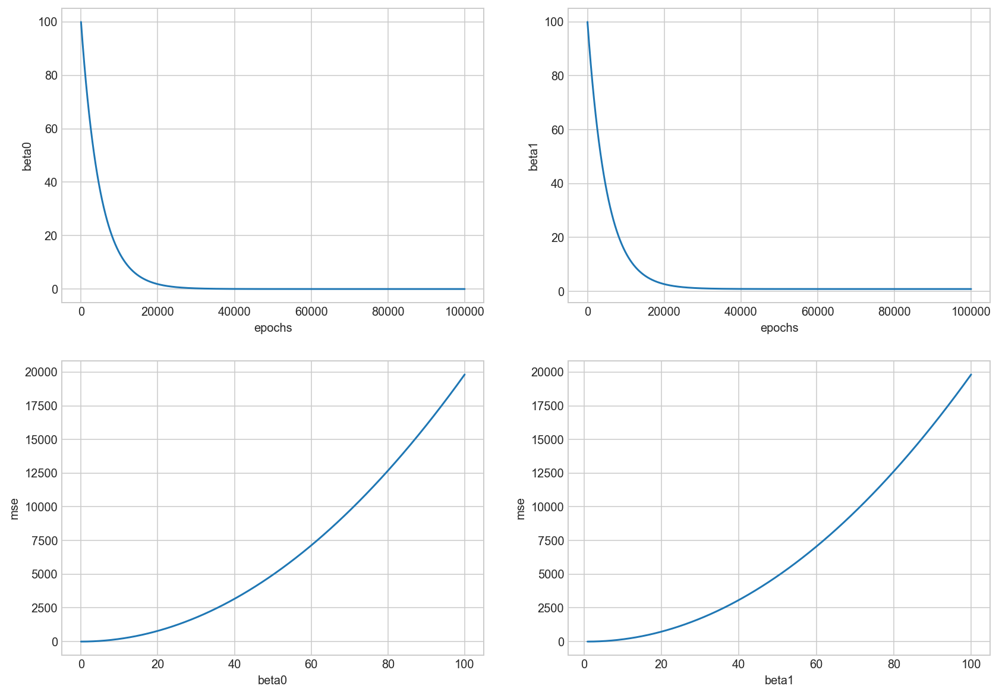

In [48]:
fig = plt.figure(figsize=(14,10))

plt.subplot(2, 2, 1)
plt.plot(beta0_t)
plt.ylabel('beta0')
plt.xlabel('epochs')

plt.subplot(2, 2, 2)
plt.plot(beta1_t)
plt.ylabel('beta1')
plt.xlabel('epochs')

plt.subplot(2, 2, 3)
plt.plot(beta0_t,mse_t)
plt.ylabel('mse')
plt.xlabel('beta0')


plt.subplot(2, 2, 4)
plt.plot(beta1_t,mse_t)
plt.ylabel('mse')
plt.xlabel('beta1')

plt.show()

In [49]:
def descenso_del_gradiente(X,y,num_steps = 100,learningRate = 0.10,criteria = 1e-5):
    """
    Toma como parametros la variable predicora X y la variable target.
    Se establece como parametros opcionales:
    num_steps: que define la cantidad máxima de saltos como un criterio de salida
    learning_rate: define la velocidad de aprendizaje
    criteria: define un segundo criterio de salida cuando el error es inferior a ese valor.
    """
    
    b_0 = 1
    b_1 = 1
    
    # en esta variable vamos a almacenar el MSE de la corrida anterior para luego calcular 
    # cuanto se redujo el error en un salto de gradiente.
    mse_previo = 0
    
    # Proceso iterativo como máximo realiza num_steps loops.
    for step in range(0, num_steps):
        
        #luego de inicializar los parametros calulamos el MSE actual para esos parametros
        mse_actual = metrics.mean_squared_error(y,  b_0 + b_1*X)
        
        # Plot
        plt.figure(figsize=(8,4))
        plt.scatter(X, y, alpha=0.5)
        plt.plot(X, b_0 + b_1*X)
        plt.title('step: ' + str(step+1))
        plt.xlabel('x')
        plt.ylabel('y')
        plt.text(3, 6, "b0  = " + str(b_0))
        plt.text(3, 5, "b1  = " + str(b_1))
        plt.text(3, 4, "MSE = " + str(mse_actual))
        if step > 0:
            plt.text(3, 3, "reduccion del MSE = " + str(round(100*(mse_previo-mse_actual)/mse_previo,4))+"%")
        plt.show()
                  
        
                     
        b_0_gradient = 0
        b_1_gradient = 0
        N = len(X)
        
        for i in range(0, len(X)):
            b_0_gradient -= (2.0/N) * (y[i] - (b_0 + b_1 * X[i]))
            b_1_gradient -= (2.0/N) * (y[i] - (b_0 + b_1 * X[i])) * X[i]

        b_0 = b_0 - (learningRate * b_0_gradient)
        b_1 = b_1 - (learningRate * b_1_gradient)
        
        # almaceno el valor de MSE para comparar en el próximo salto
        mse_previo = mse_actual
                
        #verifico criterio de parada 
        if max(abs(learningRate * b_0_gradient), abs(learningRate * b_1_gradient)) < criteria:
            break
    
    
    return

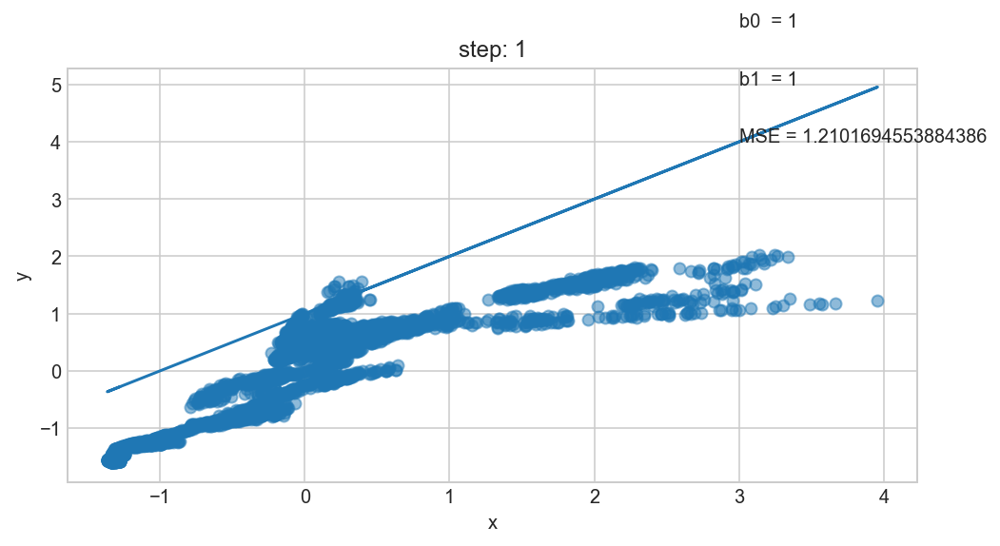

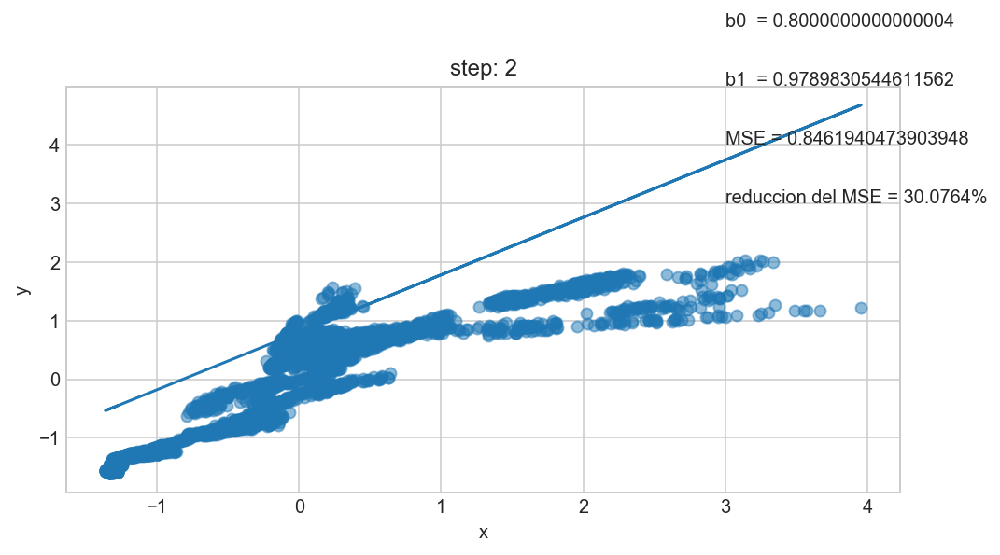

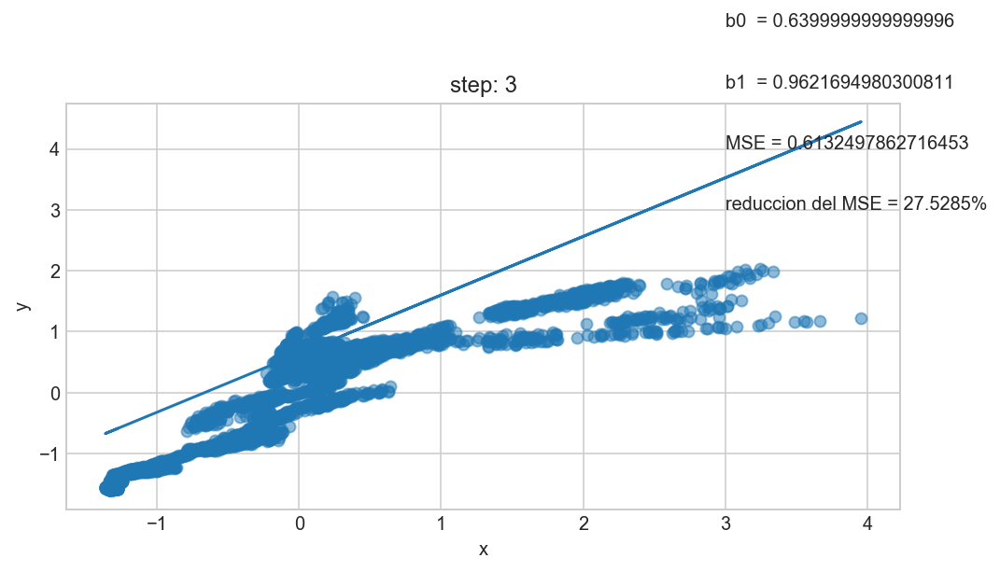

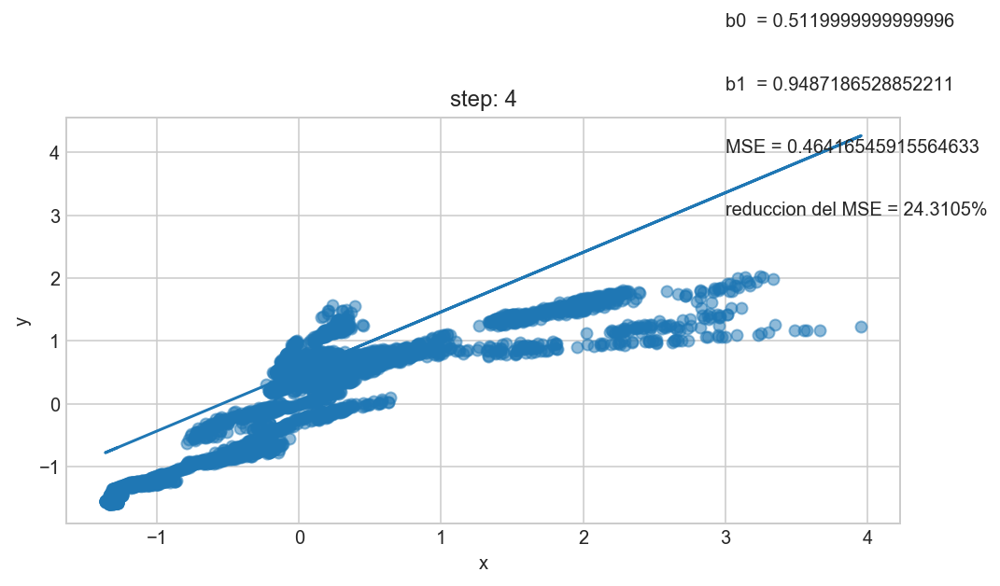

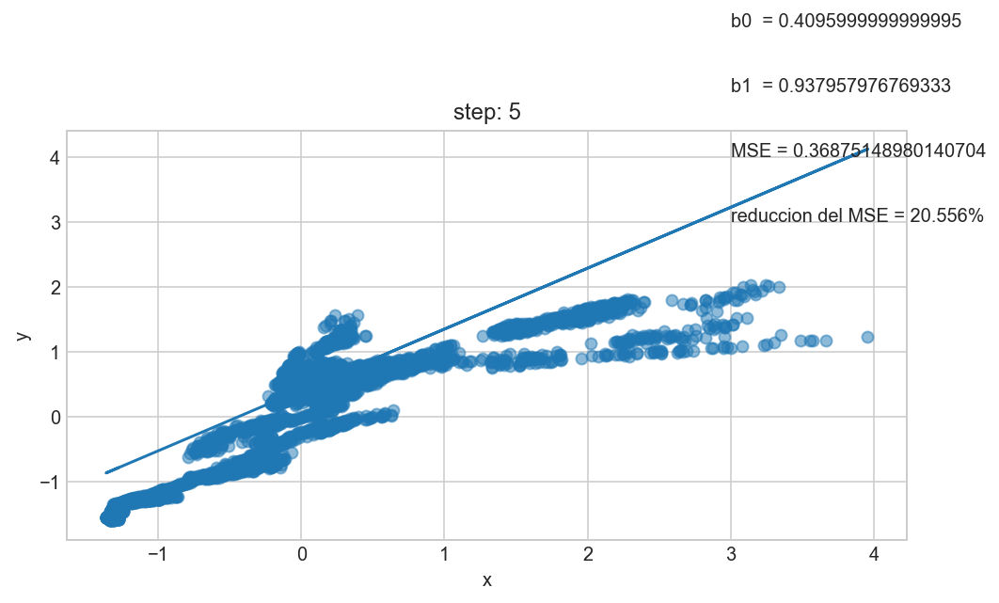

...

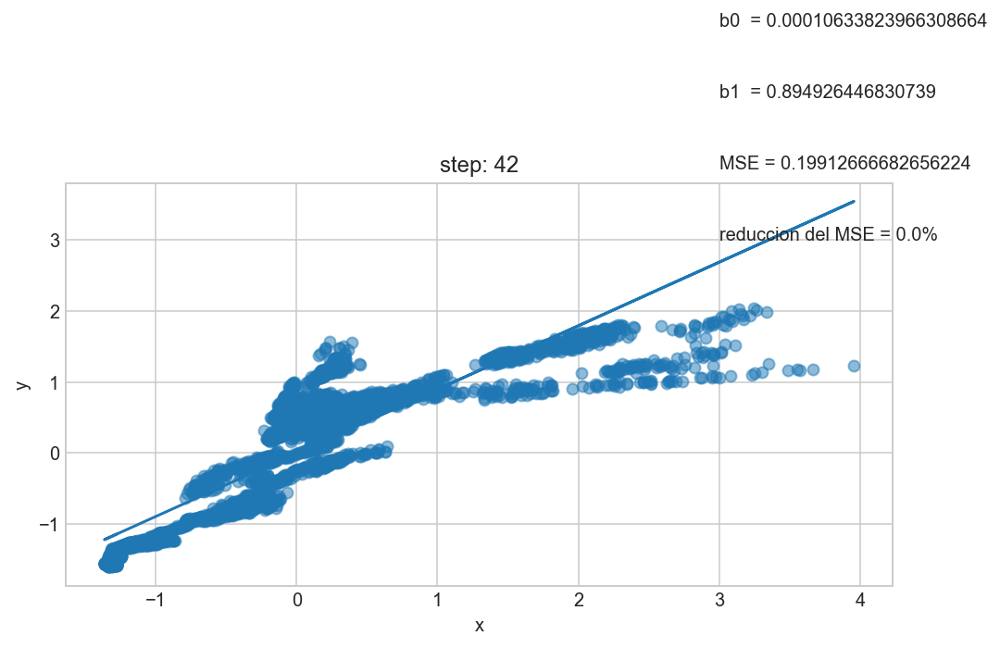

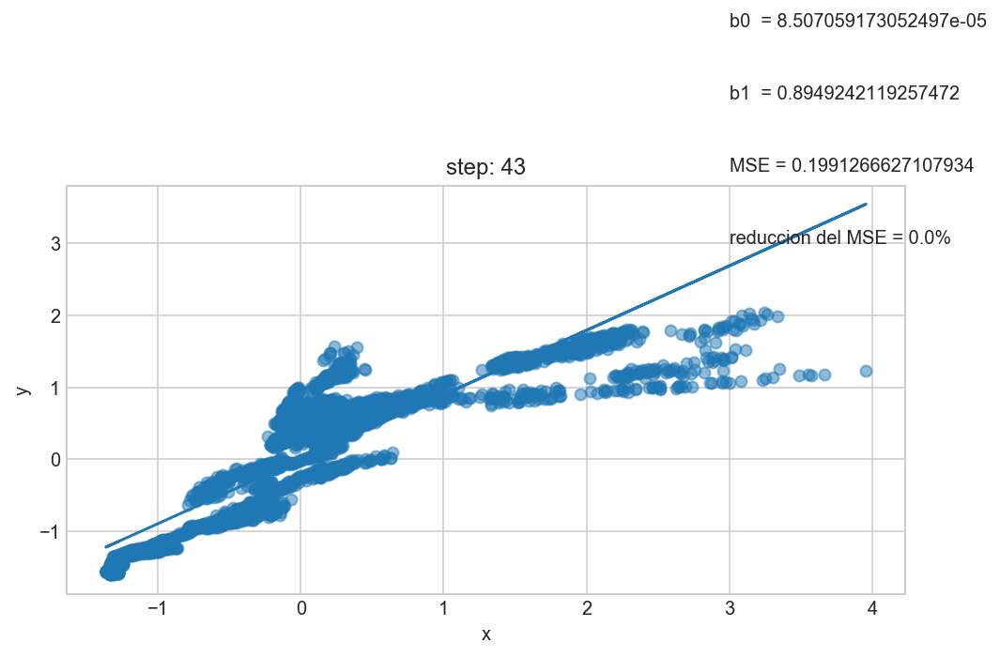

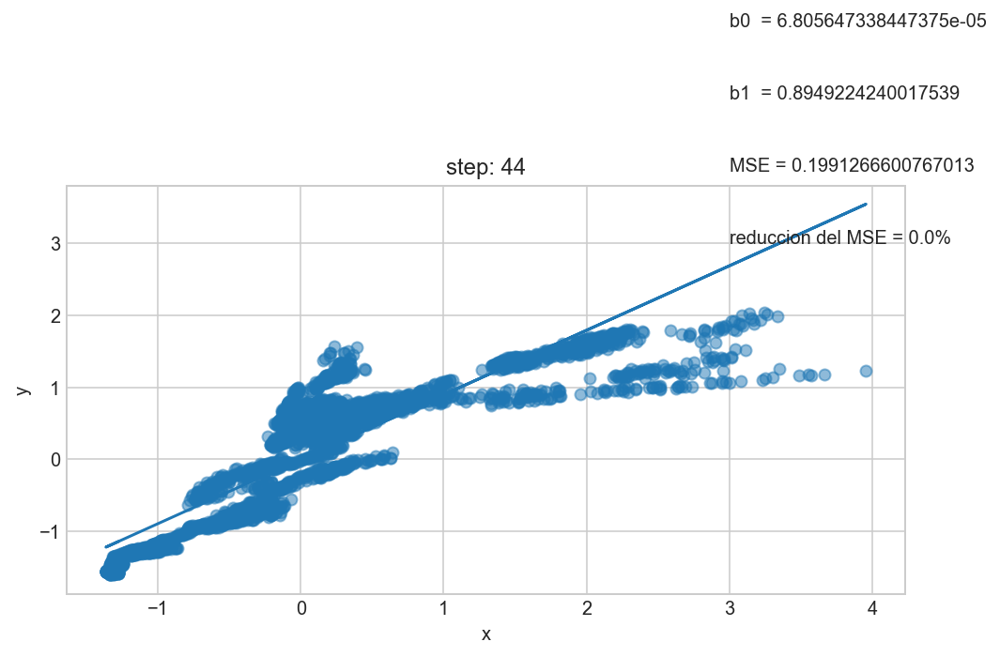

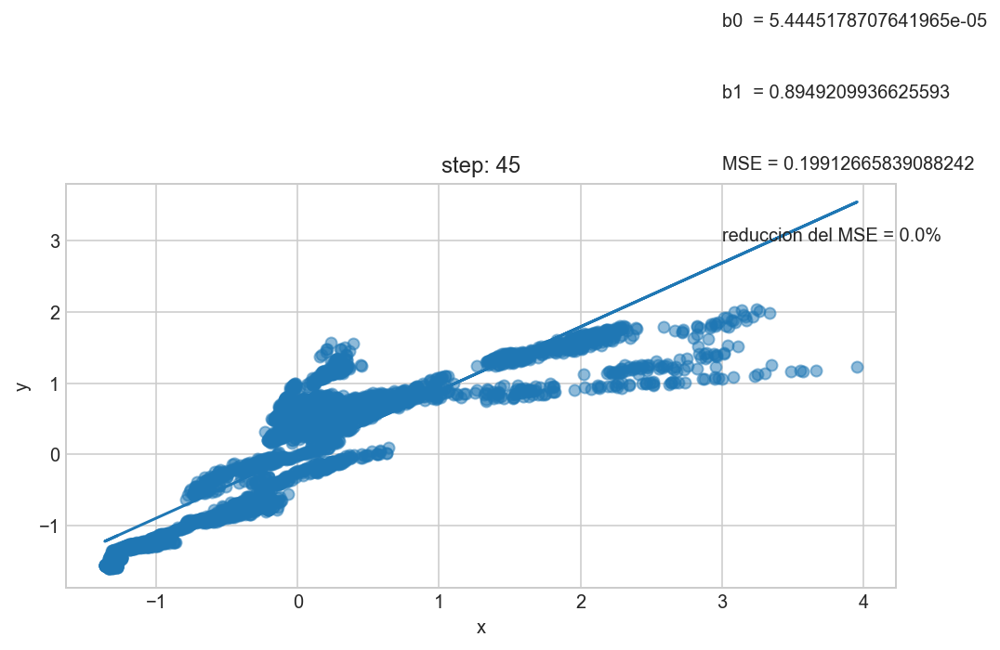

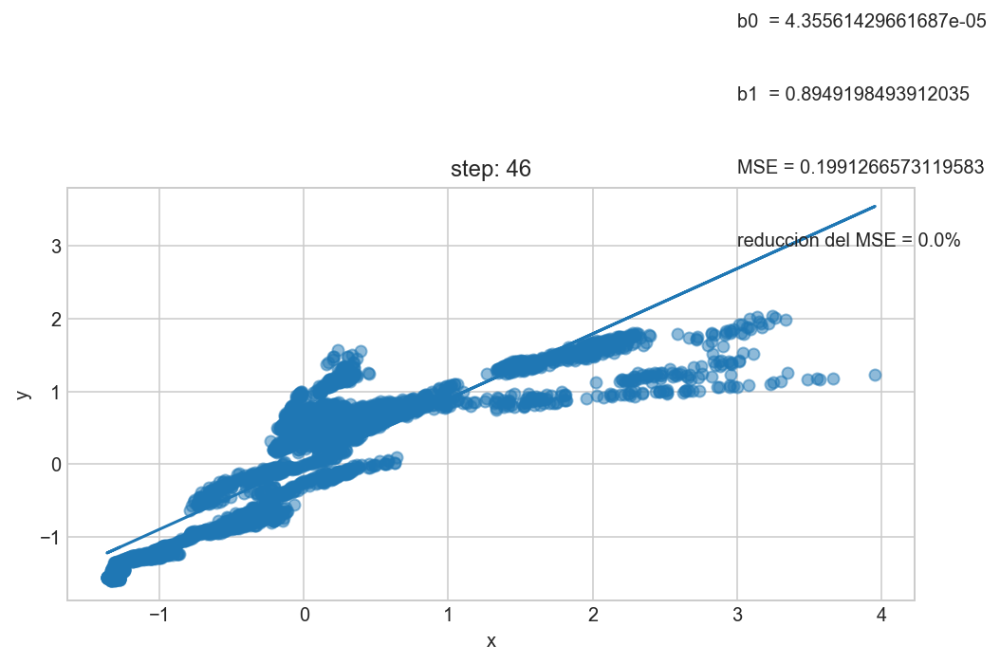

In [50]:
descenso_del_gradiente(plata, oro)